# Analysis for the MOTMonitorEverything experiment
For analyzing MOT positional drift and trying to find correlations with the beam powers (measured with scattering into the fW detector as well as into a camera), coil monitor outputs, zotino outputs. the experiments related to this analysis began on 9/8/23 in an attempt to figure out why the MOT was moving, as found both by looking at images of the MOT across different experiments, and by noticing that the SPCM count rate decreased after aligning the MOT then starting a new experiment. We noticed that at least one coil channel, Ztop, was giving noisy output on the monitor, which may have been part of the issue, but switching to a new driver did not entirely fix the MOT positional stability.

In [1]:
import numpy as np
from matplotlib import pyplot as plt
import h5py
import os
import csv
import json
import tifffile  # to load tiff files efficiently
import cv2 # Open-CV for selecting a ROI
import itertools #to flatten a list of list
from scipy.optimize import curve_fit
import datetime
from datetime import datetime as dt
from datetime import time
results = "..\\artiq_results\\"

# ATTENTION - csvdata and the image directories have been deprecated. all of the data files for a given experiment should be in the same directory as the hdf5 files for the corresponding experiments

# origin's timestamps are in unix time times 2**32 and there seems to be
# a five hour offset. two years ago I observed a 6 hour offset, but they may
# have been a daylight savings time difference. also this issue doesn't arise
# when grabbing the data with the origin reader
origintime_to_dt = lambda x: dt.utcfromtimestamp(x/2**32 - 5*3600).strftime(
    '%m-%d %H:%M')

In [2]:
# from https://stackoverflow.com/questions/37765197/darken-or-lighten-a-color-in-matplotlib
def lighten_color(color, amount=0.5):
    """
    Lightens the given color by multiplying (1-luminosity) by the given amount.
    Input can be matplotlib color string, hex string, or RGB tuple.

    Examples:
    >> lighten_color('g', 0.3)
    >> lighten_color('#F034A3', 0.6)
    >> lighten_color((.3,.55,.1), 0.5)
    """
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])

## 2024.01.24
An updated analysis of the data analyzed in this notebook on 2023.09.28.

We think the most likely cause of the instability we see with the MOT is beam imbalance, which is a result of polarization drift such that although the fW detector feedback loop succeeds in stabilizing the level of scattering it measures from each of the 4 MOT beams, the light at the atoms, I.e. after the polarizers, is nonetheless drifting. I realized that I can check this by analyzing my data from 2023.09.28 in which the on-chip scattering in certain ROIs as viewed with the Luca camera was compared to that seen by the fW detectors. If the hypothesis of polarization drift is correct, I should see that show up when comparing two ROIs: one on the appropriate MOT tube, and one on the opposite MOT tube. If there is no polarization drift, the scattering on these two ROIs should drift together. 
 

### import data

In [3]:
os.getcwd()

'D:\\Networking Exp Data\\Monitor MOT powers MOT position and B fields'

In [4]:
with open('.\\20230927\\dataset_db_20230928.json') as f: # the file is .json because the h5 file was corrupt
    data = json.load(f)

In [23]:
MOTdata = [np.array(data[f'MOT{i+1}_monitor']) for i in range(6)] +  [np.array(data['MOT_switchyard_monitor'])]

In [5]:
data.keys()

dict_keys(['AOM_A1_freq', 'AOM_A1_power', 'AOM_A2_freq', 'AOM_A2_power', 'AOM_A3_freq', 'AOM_A3_power', 'AOM_A4_freq', 'AOM_A4_power', 'AOM_A5_freq', 'AOM_A5_power', 'AOM_A6_freq', 'AOM_A6_power', 'AX_volts_MOT', 'AX_volts_PGC', 'AX_volts_RO', 'AY_volts_MOT', 'AY_volts_PGC', 'AY_volts_RO', 'AZ_bottom_volts_MOT', 'AZ_bottom_volts_PGC', 'AZ_bottom_volts_RO', 'AZ_top_volts_MOT', 'AZ_top_volts_PGC', 'AZ_top_volts_RO', 'FORT_monitor', 'MOT1_monitor', 'MOT2_monitor', 'MOT3_monitor', 'MOT4_monitor', 'MOT5_fW_Thor_monitor', 'MOT5_fW_monitor', 'MOT5_monitor', 'MOT6_monitor', 'MOT_beam_monitor_points', 'MOT_switchyard_monitor', 'Vx_array', 'Vy_array', 'Vz_bottom_array', 'Vz_top_array', '[-1.5 - i*(3.3 - 1.5)/20 for i in range(20)][:1]', '[0.025 - k*(0.9 + 0.025)/20 for k in range(20)][:1]', '[0.15 - j*(0.8 + 0.15)/20 for j in range(20)][:1]', '[0.6 - l*(0.6 - 1)/20 for l in range(20)][:1]', 'aom_feedback_averages', 'aom_feedback_iterations', 'cooling_setpoint_mW', 'cooling_volts_ch', 'enable_las

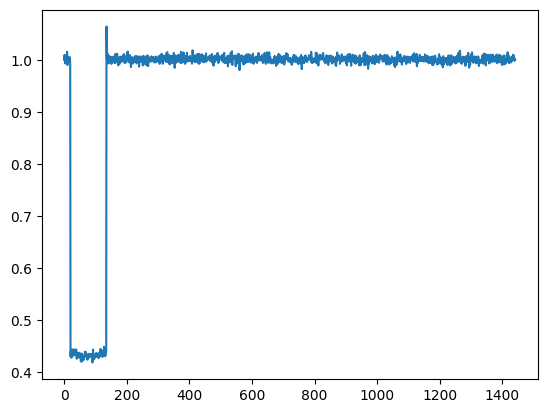

In [6]:
plt.plot(data['MOT1_monitor'])

In [7]:
MOT1 = np.array(data['MOT1_monitor'])
MOT2 = np.array(data['MOT2_monitor'])
MOT3 = np.array(data['MOT3_monitor'])
MOT4 = np.array(data['MOT4_monitor'])

In [8]:
fW_Thor_data = np.array(data['fW_Thor_monitor'])[7:]

In [9]:
len(fW_Thor_data), (len(fW_Thor_data))/6

(8640, 1440.0)

In [10]:
MOT1_Thor = np.array([fW_Thor_data[i*6+2] for i in range(len(fW_Thor_data)//6)])
MOT1_Thor /= np.mean(MOT1_Thor)
MOT2_Thor = np.array([fW_Thor_data[i*6+3] for i in range(len(fW_Thor_data)//6)])
MOT2_Thor /= np.mean(MOT2_Thor)
MOT3_Thor = np.array([fW_Thor_data[i*6+4] for i in range(len(fW_Thor_data)//6)])
MOT3_Thor /= np.mean(MOT3_Thor)
MOT4_Thor = np.array([fW_Thor_data[i*6+5] for i in range(len(fW_Thor_data)//6)])
MOT4_Thor /= np.mean(MOT4_Thor)

In [11]:
Xmax = 10
prefix = ".\\20230927\\MOTFeedbackCheckWithfWThorlabs" # todo move data to the experiment folder?
filenames = [prefix+".tif"] + [prefix + f"_X{i}.tif" for i in range(2,Xmax+1)]

tifstack = np.array(list(itertools.chain(*[tifffile.imread(os.path.join(f))
    for f in filenames
]))) # flattening tifstackList

In [12]:
(len(tifstack)-6) % 7

0

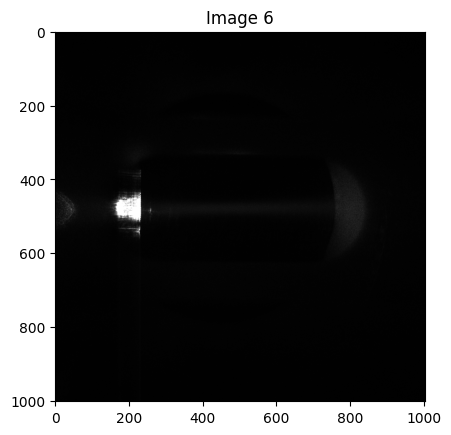

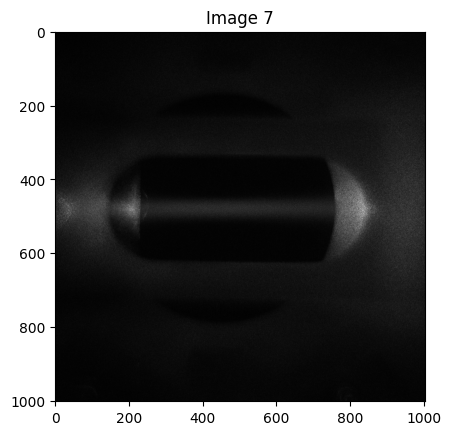

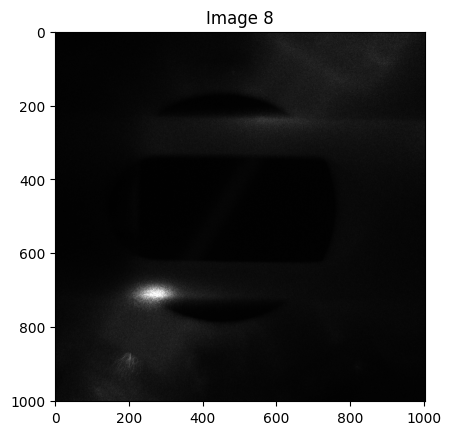

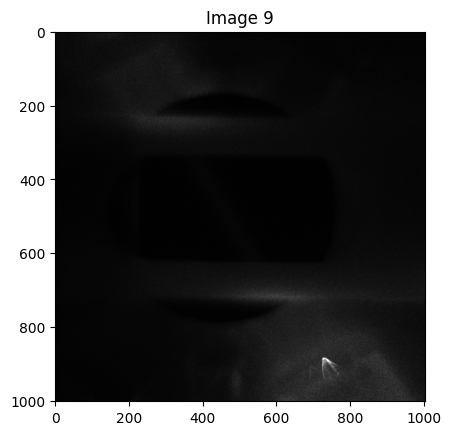

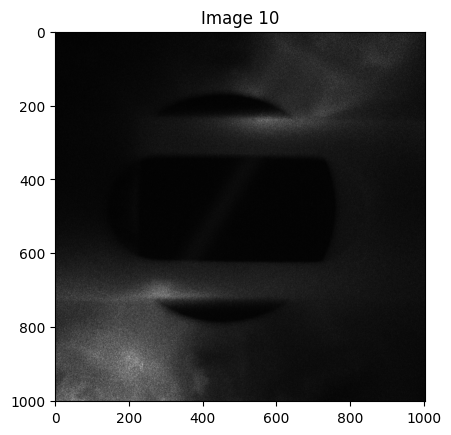

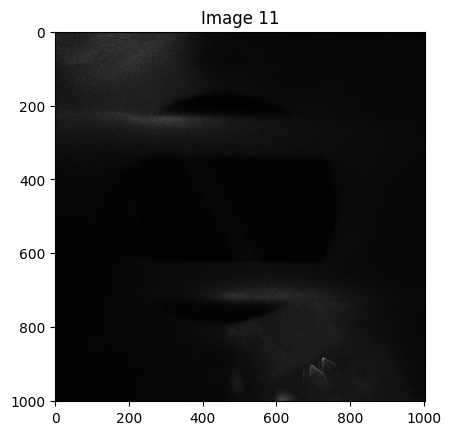

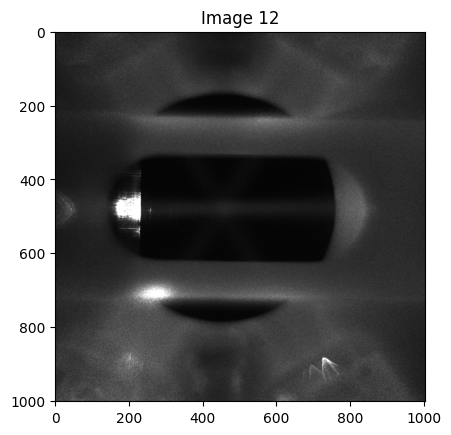

In [13]:
for i in range(6,7+6):
    image = tifstack[i]
    plt.imshow(image, cmap='gray')
    plt.title(f"Image {i}")
    plt.show()

In [16]:
lucaMOTdata = np.reshape(tifstack[6:],(-1,7,*tifstack.shape[1:]))

### find ROIs for the MOT beam scattering

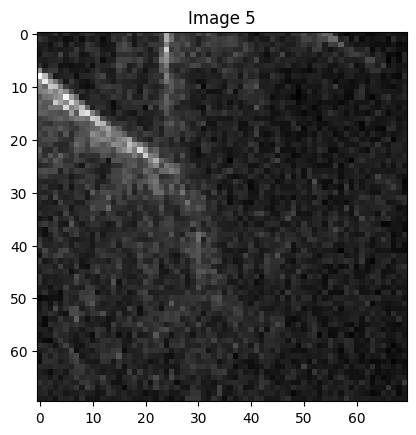

In [52]:
# for i in range(0,7):
#     image = lucaMOTdata[1,i]
#     plt.imshow(image, cmap='gray')
#     plt.title(f"Image {i}")
#     plt.show()

i=5
image = lucaMOTdata[1,i][900:970,700:770]
plt.imshow(image, cmap='gray')
plt.title(f"Image {i}")
plt.show()

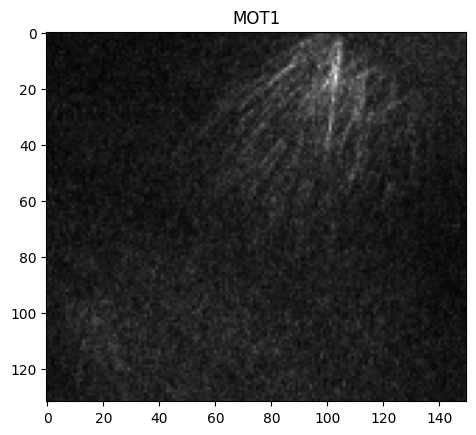

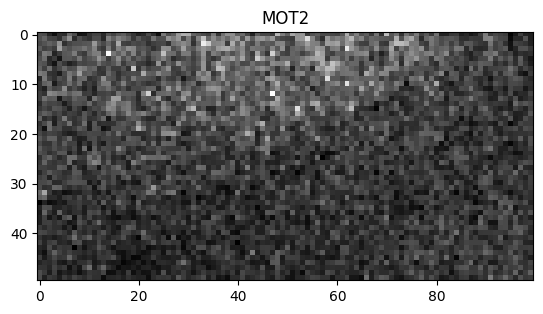

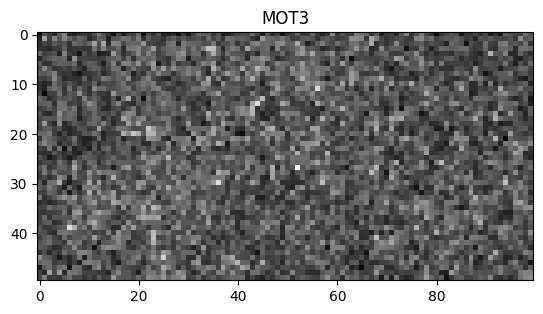

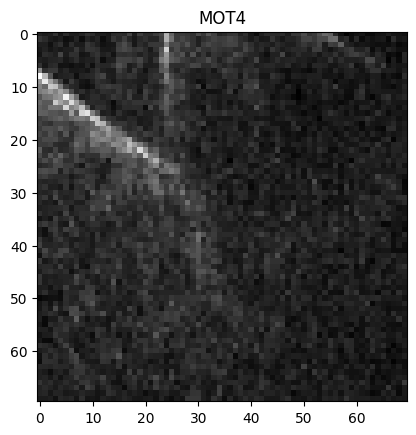

In [60]:
# ROIs for scattering on the MOT launcher itself

# MOT1
image = lucaMOTdata[1,2][870:,100:250]
plt.imshow(image, cmap='gray')
plt.title(f"MOT1")
plt.show()

# MOT2
image = lucaMOTdata[1,3][:50,100:200]
plt.imshow(image, cmap='gray')
plt.title(f"MOT2")
plt.show()

# MOT3 
image = lucaMOTdata[1,4][:50,700:800]
plt.imshow(image, cmap='gray')
plt.title(f"MOT3")
plt.show()

# MOT4
image = lucaMOTdata[1,5][900:970,700:770]
plt.imshow(image, cmap='gray')
plt.title(f"MOT4")
plt.show()

lucaMOT1_data_launcher = lucaMOTdata[:,2,870:,100:250]
lucaMOT2_data_launcher = lucaMOTdata[:,3,:50,100:200]
lucaMOT3_data_launcher = lucaMOTdata[:,4,:50,700:800]
lucaMOT4_data_launcher = lucaMOTdata[:,5,900:970,700:770]

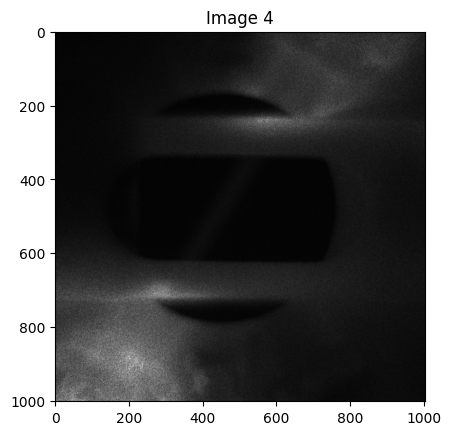

In [57]:
# for i in range(0,7):
#     image = lucaMOTdata[1,i]
#     plt.imshow(image, cmap='gray')
#     plt.title(f"Image {i}")
#     plt.show()

i=4
image = lucaMOTdata[1,i]
plt.imshow(image, cmap='gray')
plt.title(f"Image {i}")
plt.show()

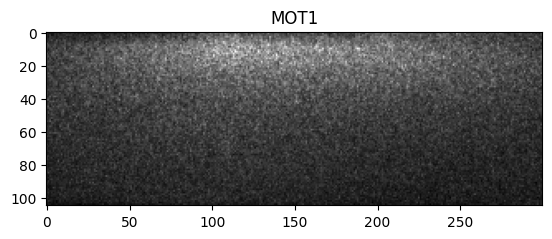

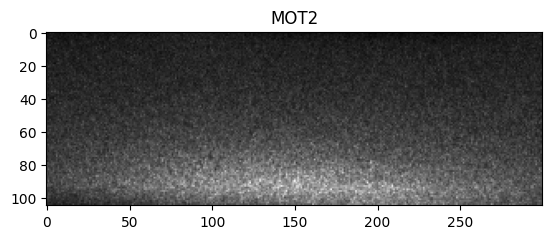

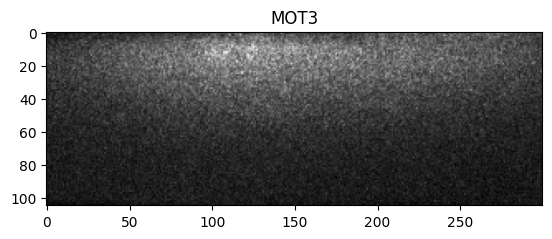

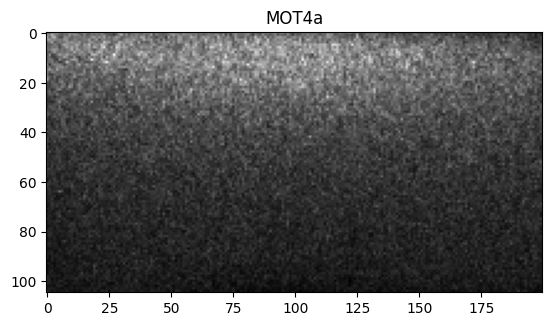

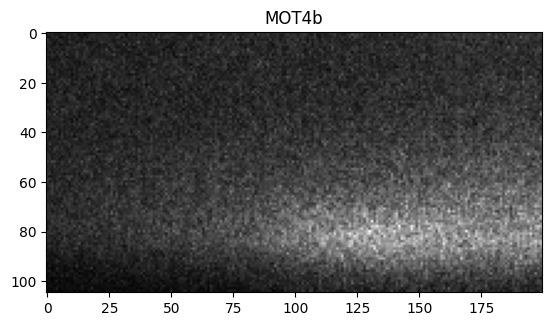

In [61]:
# ROIs for scattering after the MOT launcher, which should correlate with the
# scattering on the MOT launcher if polarization drift is not a problem,
# or if the polarization happened to be stable over the duration of this
# measurement

image = lucaMOTdata[1,2][230:335,450:750] # after MOT 1 launcher
plt.imshow(image, cmap='gray')
plt.title(f"MOT1")
plt.show()

# MOT2
image = lucaMOTdata[1,3][625:730,450:750] # after of MOT 2 launcher
plt.imshow(image, cmap='gray')
plt.title(f"MOT2")
plt.show()

# MOT3 
image = lucaMOTdata[1,4][230:335,450:750] # after MOT 3 launcher
plt.imshow(image, cmap='gray')
plt.title(f"MOT3")
plt.show()

# scattering from MOT4 is weak, so use two ROIs
# MOT4a
image = lucaMOTdata[1,5][230:335,200:400] # after MOT 4 launcher, one side of macor tube
plt.imshow(image, cmap='gray')
plt.title(f"MOT4a")
plt.show()
# MOT4b
image = lucaMOTdata[1,5][635:740,350:550] # after MOT 4 launcher, other side of macor tube
plt.imshow(image, cmap='gray')
plt.title(f"MOT4b")
plt.show()

lucaMOT1_data = lucaMOTdata[:,2,230:335,450:750]
lucaMOT2_data = lucaMOTdata[:,3,625:730,450:750]
lucaMOT3_data = lucaMOTdata[:,4,230:335,450:750]
lucaMOT4a_data = lucaMOTdata[:,5,230:335,200:400]
lucaMOT4b_data = lucaMOTdata[:,5,635:740,350:550]

In [59]:
lucadata_len = len(lucaMOTdata)
len(lucaMOTdata), len(MOTdata[0][23:])

(1440, 1419)

### plot data from Femto and Thorlabs fW detectors, and from camera ROIs

In [68]:
# luca data is defined in the cells above

# Luca data - sum the scattering from the ROIs and normalize to the mean of each
colors = ['darkred','darkviolet','darkorange','dodgerblue','teal','crimson','indigo']

y1pts = np.array([np.sum(lucaMOT1_data[i]) for i in range(lucadata_len)],dtype=float)
y1pts /= np.mean(y1pts)
y2pts = np.array([np.sum(lucaMOT2_data[i]) for i in range(lucadata_len)],dtype=float)
y2pts /= np.mean(y2pts)
y3pts = np.array([np.sum(lucaMOT3_data[i]) for i in range(lucadata_len)],dtype=float)
y3pts /= np.mean(y3pts)
y4pts = np.array([np.sum(lucaMOT4a_data[i])+np.sum(lucaMOT4b_data[i])
                  for i in range(lucadata_len)],dtype=float)
y4pts /= np.mean(y4pts)

y1pts_launcher = np.array([np.sum(lucaMOT1_data_launcher[i]) for i in range(lucadata_len)],dtype=float)
y1pts_launcher /= np.mean(y1pts_launcher)
y2pts_launcher = np.array([np.sum(lucaMOT2_data_launcher[i]) for i in range(lucadata_len)],dtype=float)
y2pts_launcher /= np.mean(y2pts_launcher)
y3pts_launcher = np.array([np.sum(lucaMOT3_data_launcher[i]) for i in range(lucadata_len)],dtype=float)
y3pts_launcher /= np.mean(y3pts_launcher)
y4pts_launcher = np.array([np.sum(lucaMOT4_data_launcher[i]) for i in range(lucadata_len)],dtype=float)
y4pts_launcher /= np.mean(y4pts_launcher)
xpts = range(len(y4pts))

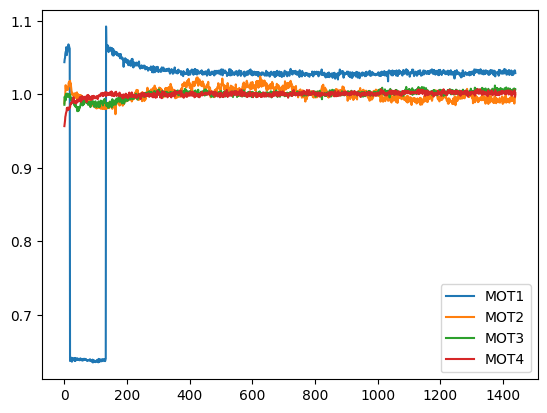

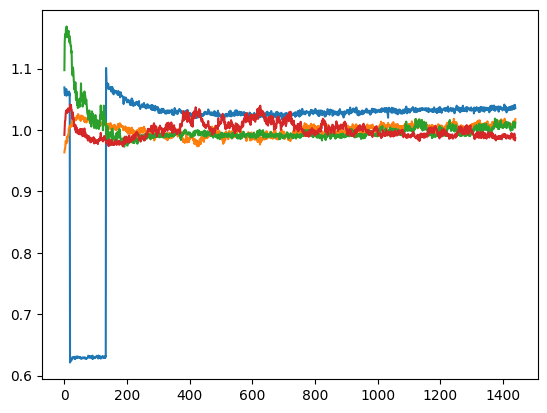

In [74]:
plt.plot(y1pts,label='MOT1')
plt.plot(y2pts,label='MOT2')
plt.plot(y3pts,label='MOT3')
plt.plot(y4pts,label='MOT4')
plt.legend()
plt.show()

plt.plot(y1pts_launcher,label='MOT1')
plt.plot(y2pts_launcher,label='MOT2')
plt.plot(y3pts_launcher,label='MOT3')
plt.plot(y4pts_launcher,label='MOT4')

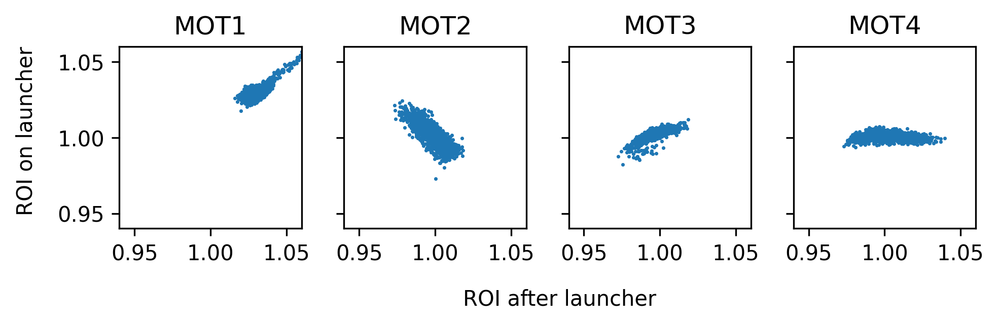

In [75]:
# plot each beam pair in its own subplot

labels = [f'MOT{i+1}' for i in range(4)]+['switchyard_in']
fig,axes = plt.subplots(ncols=4,dpi=300,sharey=True)
MOTaxes = axes
start_at = 150

for label,launcher_data,after_launcher_data,color,ax in zip(
    labels,[y1pts,y2pts,y3pts,y4pts],[y1pts_launcher,y2pts_launcher,y3pts_launcher,y4pts_launcher],colors,MOTaxes):

    ax.set_title(label)
    ax.scatter(after_launcher_data[start_at:], launcher_data[start_at:] ,s=0.5)
     
    # det_str = ',Femto fW' if float(label[-1]) < 5 else ',i2v'
    # ax.plot(data_Femto_fW[:lucadata_len], color=color, label=label+det_str,linewidth=0.5)
    # det_str = ',Thor fW' if float(label[-1]) < 5 else ',i2v'
    # ax.plot(data_Thor_fW[:lucadata_len], color='red', label=label+det_str,linewidth=0.5,linestyle='-')
    # ax.plot(data_luca, color=lighten_color(color,0.3), label=label+',Luca',linewidth=0.5)
    ax.set_ylim((0.94,1.06))
    ax.set_xlim((0.94,1.06))
    ax.set_aspect('equal')
    # ax.legend(loc=(1.05,0.1))

fig.text(0.44,0.27, 'ROI after launcher')
# fig.text(-0.02,0.45, 'Thor. fW',rotation=90,color='tab:orange')
# fig.text(-0.0,0.45, 'Femto fW',rotation=90,color='tab:blue')
fig.text(-0.02,0.4, 'ROI on launcher',rotation=90)
fig.tight_layout()

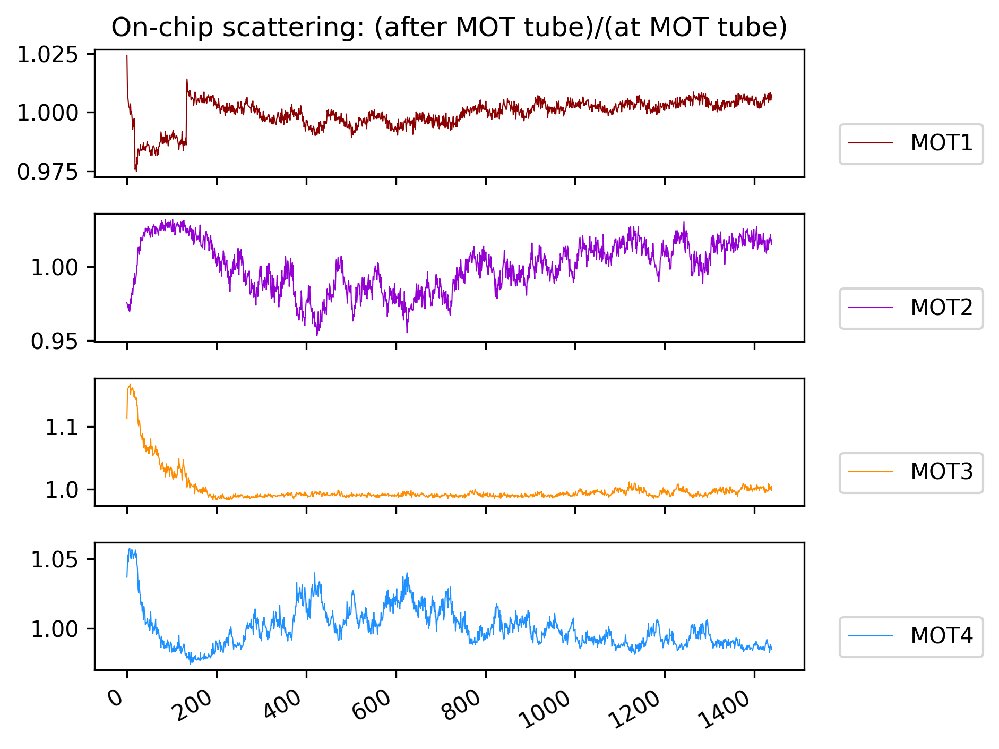

In [80]:
# plot each beam pair in its own subplot

labels = [f'MOT{i+1}' for i in range(4)]+['switchyard_in']
fig,axes = plt.subplots(nrows=4,dpi=300)
MOTaxes = axes
# axSPCM = axes[-1]
for label,launcher_data,after_launcher_data,color,ax in zip(
    labels,[y1pts,y2pts,y3pts,y4pts],[y1pts_launcher,y2pts_launcher,y3pts_launcher,y4pts_launcher],colors,MOTaxes):
    # # det_str = ',Femto fW' if float(label[-1]) < 5 else ',i2v'
    # ax.plot(data_Femto_fW[:lucadata_len], color=color, label=label+det_str,linewidth=0.5)
    # det_str = ',Thor fW' if float(label[-1]) < 5 else ',i2v'
    # ax.plot(data_Thor_fW[:lucadata_len], color='red', label=label+det_str,linewidth=0.5,linestyle='-')
    # ax.plot(data_luca, color=lighten_color(color,0.3), label=label+',Luca',linewidth=0.5)
    ax.plot(after_launcher_data/launcher_data, color=color, label=label,linewidth=0.5)
    # ax.set_ylim((0.94,1.06))
    ax.legend(loc=(1.05,0.1))
# ax.get_xaxis().set_visible(False)
axes[0].set_title("On-chip scattering: (after MOT tube)/(at MOT tube)")
    
ax.legend(loc=(1.05,0.1))
# ax.get_xaxis().set_visible(False)
# counts_steps = len(counts_Hz)

# hr0 = 17
# min0 = 10
# timestamps = [((hr0+(min0+i)//60)%24,(min0+i)%60) for i in range(900)]

# SPCM data
# axSPCM.plot(range(counts_steps),counts_Hz,label='SPCM counts',linewidth=0.5)
# ax2.set_xticks(timestamps)
plt.gcf().autofmt_xdate()
# axSPCM.legend(loc=(1.05,0.4))
fig.tight_layout()

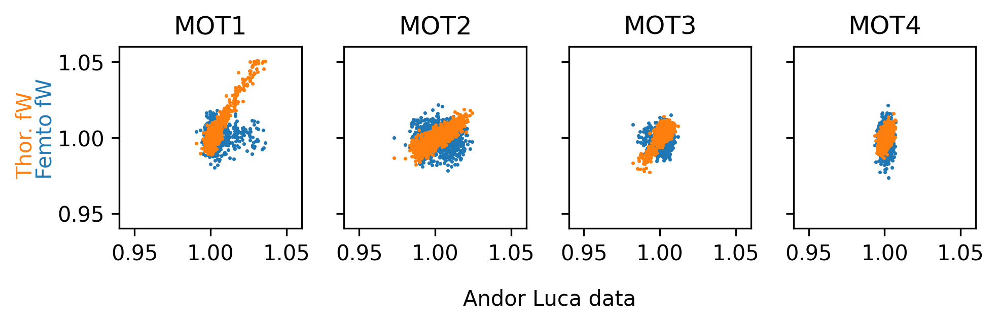

In [29]:
# plot each beam pair in its own subplot

labels = [f'MOT{i+1}' for i in range(4)]+['switchyard_in']
fig,axes = plt.subplots(ncols=4,dpi=300,sharey=True)
MOTaxes = axes
start_at = 150

for label,data_Femto_fW,data_Thor_fW,data_luca,color,ax in zip(
    labels,MOTdata[:4],[MOT1_Thor/1.04,MOT2_Thor,MOT3_Thor,MOT4_Thor],[y1pts-0.027,y2pts,y3pts,y4pts,y5pts,y6pts],colors,MOTaxes):

    ax.set_title(label)
    ax.scatter(data_luca[start_at:], data_Femto_fW[start_at:lucadata_len] ,s=0.5)
    ax.scatter(data_luca[start_at:], data_Thor_fW[start_at:lucadata_len], s=0.5)
     
    # det_str = ',Femto fW' if float(label[-1]) < 5 else ',i2v'
    # ax.plot(data_Femto_fW[:lucadata_len], color=color, label=label+det_str,linewidth=0.5)
    # det_str = ',Thor fW' if float(label[-1]) < 5 else ',i2v'
    # ax.plot(data_Thor_fW[:lucadata_len], color='red', label=label+det_str,linewidth=0.5,linestyle='-')
    # ax.plot(data_luca, color=lighten_color(color,0.3), label=label+',Luca',linewidth=0.5)
    ax.set_ylim((0.94,1.06))
    ax.set_xlim((0.94,1.06))
    ax.set_aspect('equal')
    # ax.legend(loc=(1.05,0.1))

fig.text(0.44,0.27, 'Andor Luca data')
fig.text(-0.02,0.45, 'Thor. fW',rotation=90,color='tab:orange')
fig.text(-0.0,0.45, 'Femto fW',rotation=90,color='tab:blue')

fig.tight_layout()

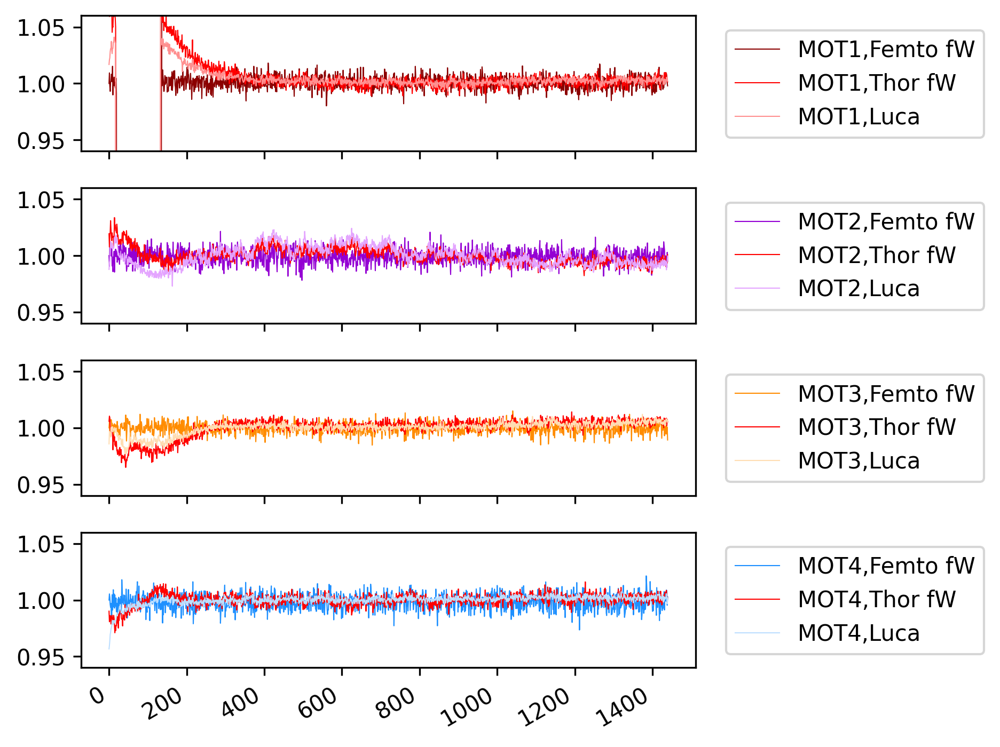

In [30]:
# plot each beam pair in its own subplot

labels = [f'MOT{i+1}' for i in range(4)]+['switchyard_in']
fig,axes = plt.subplots(nrows=4,dpi=300)
MOTaxes = axes
# axSPCM = axes[-1]

for label,data_Femto_fW,data_Thor_fW,data_luca,color,ax in zip(
    labels,MOTdata[:4],[MOT1_Thor/1.04,MOT2_Thor,MOT3_Thor,MOT4_Thor],[y1pts-0.027,y2pts,y3pts,y4pts,y5pts,y6pts],colors,MOTaxes):
    # xpts = range(len(data_Femto_fW))
#     ax.scatter(xpts, ypts, color=color,s=0.1)
    det_str = ',Femto fW' if float(label[-1]) < 5 else ',i2v'
    ax.plot(data_Femto_fW[:lucadata_len], color=color, label=label+det_str,linewidth=0.5)
    det_str = ',Thor fW' if float(label[-1]) < 5 else ',i2v'
    ax.plot(data_Thor_fW[:lucadata_len], color='red', label=label+det_str,linewidth=0.5,linestyle='-')
    ax.plot(data_luca, color=lighten_color(color,0.3), label=label+',Luca',linewidth=0.5)
    ax.set_ylim((0.94,1.06))
    ax.legend(loc=(1.05,0.1))
# ax.get_xaxis().set_visible(False)
    
ax.legend(loc=(1.05,0.1))
# ax.get_xaxis().set_visible(False)
# counts_steps = len(counts_Hz)

# hr0 = 17
# min0 = 10
# timestamps = [((hr0+(min0+i)//60)%24,(min0+i)%60) for i in range(900)]

# SPCM data
# axSPCM.plot(range(counts_steps),counts_Hz,label='SPCM counts',linewidth=0.5)
# ax2.set_xticks(timestamps)
plt.gcf().autofmt_xdate()
# axSPCM.legend(loc=(1.05,0.4))
fig.tight_layout()

## 2023.09.28
Summary: the data from last 
experiment started last night so the data is in 20230927 folder.

### import data

In [316]:
os.getcwd()

'D:\\Networking Exp Data\\Monitor MOT powers MOT position and B fields'

In [319]:
with open('.\\20230927\\dataset_db_20230928.json') as f:
    data = json.load(f)

In [320]:
data.keys()

dict_keys(['AOM_A1_freq', 'AOM_A1_power', 'AOM_A2_freq', 'AOM_A2_power', 'AOM_A3_freq', 'AOM_A3_power', 'AOM_A4_freq', 'AOM_A4_power', 'AOM_A5_freq', 'AOM_A5_power', 'AOM_A6_freq', 'AOM_A6_power', 'AX_volts_MOT', 'AX_volts_PGC', 'AX_volts_RO', 'AY_volts_MOT', 'AY_volts_PGC', 'AY_volts_RO', 'AZ_bottom_volts_MOT', 'AZ_bottom_volts_PGC', 'AZ_bottom_volts_RO', 'AZ_top_volts_MOT', 'AZ_top_volts_PGC', 'AZ_top_volts_RO', 'FORT_monitor', 'MOT1_monitor', 'MOT2_monitor', 'MOT3_monitor', 'MOT4_monitor', 'MOT5_fW_Thor_monitor', 'MOT5_fW_monitor', 'MOT5_monitor', 'MOT6_monitor', 'MOT_beam_monitor_points', 'MOT_switchyard_monitor', 'Vx_array', 'Vy_array', 'Vz_bottom_array', 'Vz_top_array', '[-1.5 - i*(3.3 - 1.5)/20 for i in range(20)][:1]', '[0.025 - k*(0.9 + 0.025)/20 for k in range(20)][:1]', '[0.15 - j*(0.8 + 0.15)/20 for j in range(20)][:1]', '[0.6 - l*(0.6 - 1)/20 for l in range(20)][:1]', 'aom_feedback_averages', 'aom_feedback_iterations', 'cooling_setpoint_mW', 'cooling_volts_ch', 'enable_las

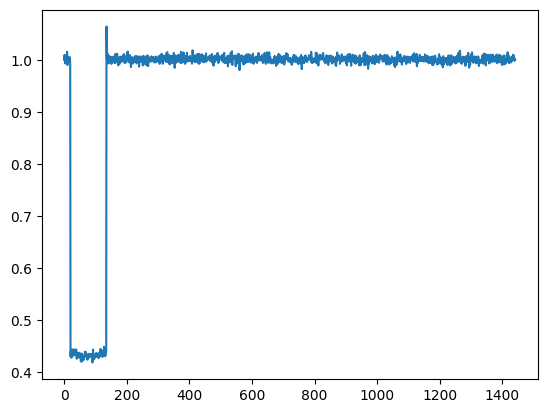

In [321]:
plt.plot(data['MOT1_monitor'])

In [322]:
MOT1 = np.array(data['MOT1_monitor'])
MOT2 = np.array(data['MOT2_monitor'])
MOT3 = np.array(data['MOT3_monitor'])
MOT4 = np.array(data['MOT4_monitor'])

In [369]:
fW_Thor_data = np.array(data['fW_Thor_monitor'])[7:]

In [370]:
len(fW_Thor_data), (len(fW_Thor_data))/6

(8640, 1440.0)

In [374]:
MOT1_Thor = np.array([fW_Thor_data[i*6+2] for i in range(len(fW_Thor_data)//6)])
MOT1_Thor /= np.mean(MOT1_Thor)
MOT2_Thor = np.array([fW_Thor_data[i*6+3] for i in range(len(fW_Thor_data)//6)])
MOT2_Thor /= np.mean(MOT2_Thor)
MOT3_Thor = np.array([fW_Thor_data[i*6+4] for i in range(len(fW_Thor_data)//6)])
MOT3_Thor /= np.mean(MOT3_Thor)
MOT4_Thor = np.array([fW_Thor_data[i*6+5] for i in range(len(fW_Thor_data)//6)])
MOT4_Thor /= np.mean(MOT4_Thor)

In [326]:
Xmax = 10
prefix = ".\\20230927\\MOTFeedbackCheckWithfWThorlabs" # todo move data to the experiment folder?
filenames = [prefix+".tif"] + [prefix + f"_X{i}.tif" for i in range(2,Xmax+1)]

tifstack = np.array(list(itertools.chain(*[tifffile.imread(os.path.join(f))
    for f in filenames
]))) # flattening tifstackList

In [327]:
(len(tifstack)-6) % 7

0

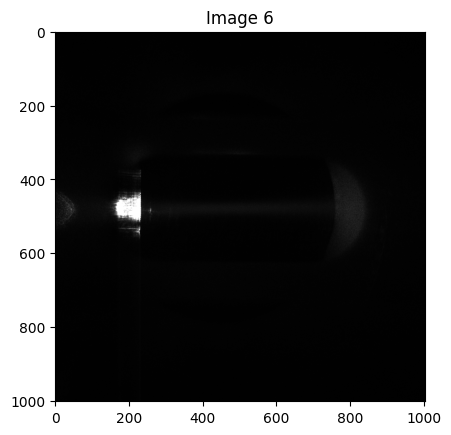

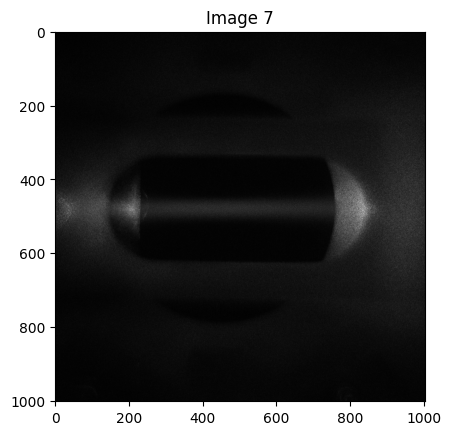

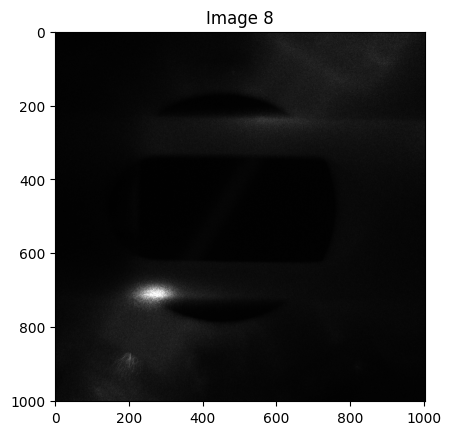

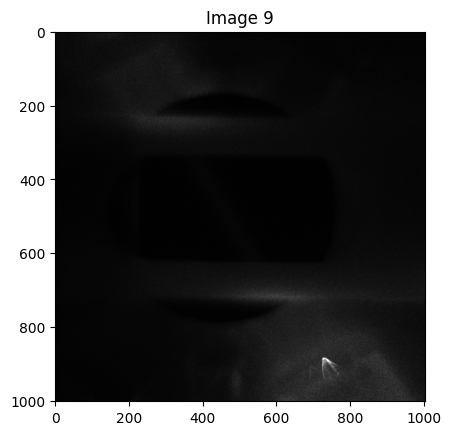

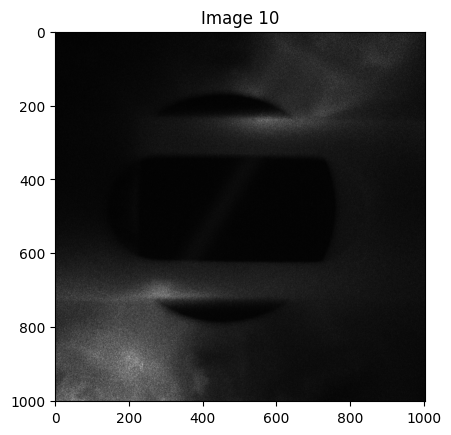

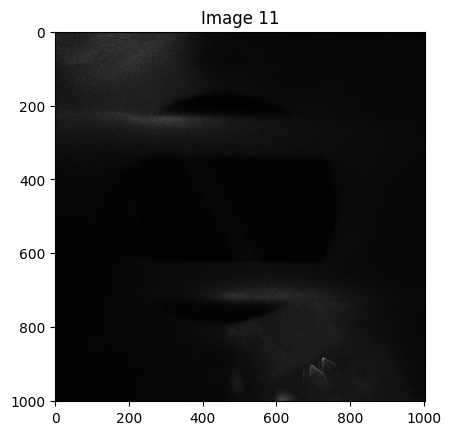

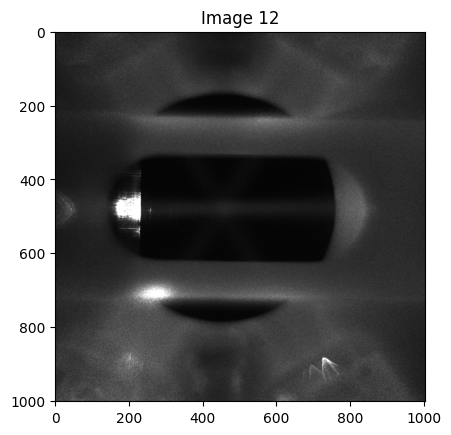

In [330]:
for i in range(6,7+6):
    image = tifstack[i]
    plt.imshow(image, cmap='gray')
    plt.title(f"Image {i}")
    plt.show()

In [331]:
lucaMOTdata = np.reshape(tifstack[6:],(-1,7,*tifstack.shape[1:]))

### find ROIs for the MOT beam scattering

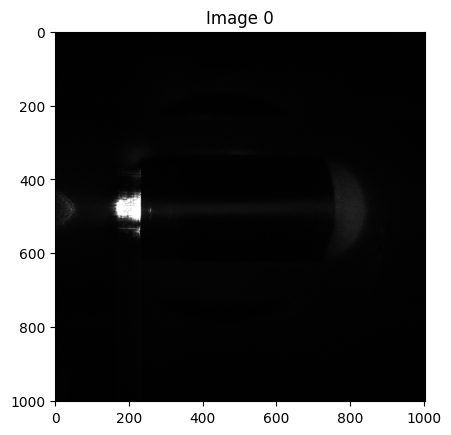

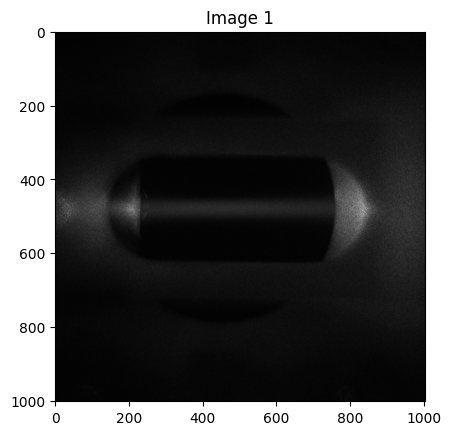

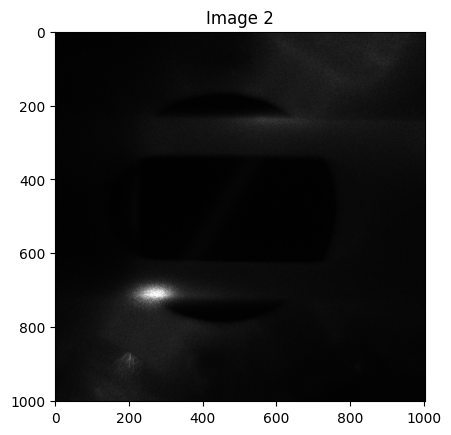

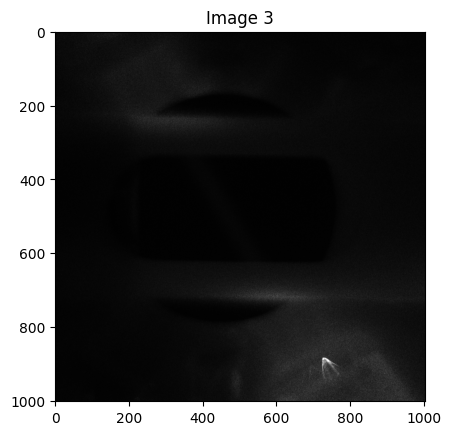

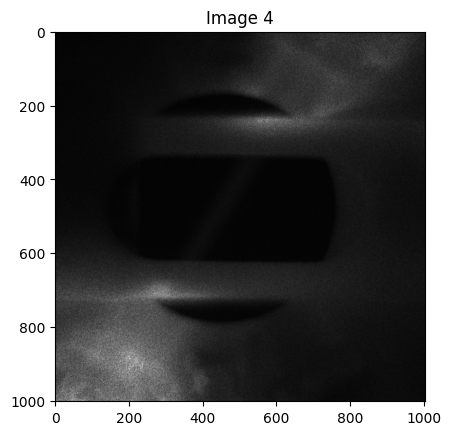

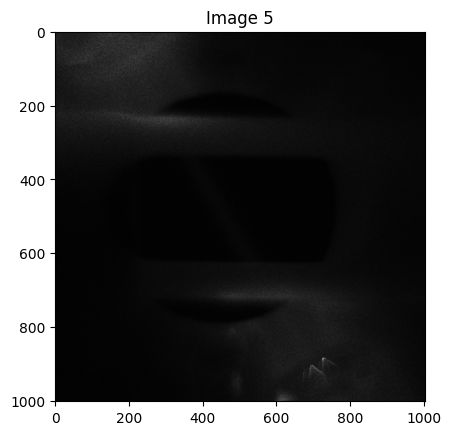

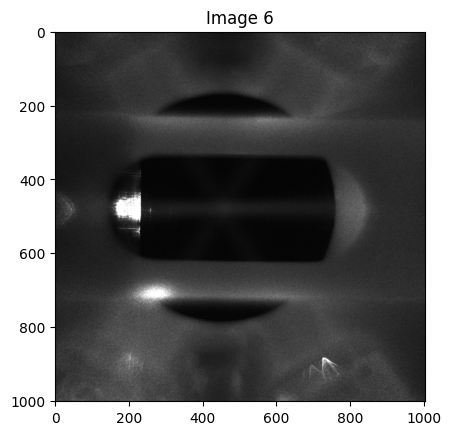

In [332]:
for i in range(0,7):
    image = lucaMOTdata[1,i]
    plt.imshow(image, cmap='gray')
    plt.title(f"Image {i}")
    plt.show()

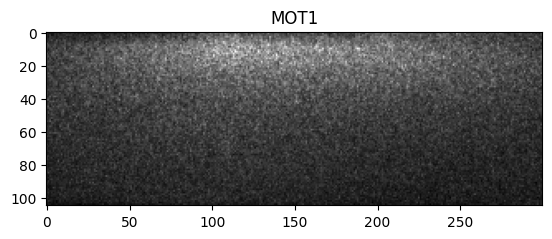

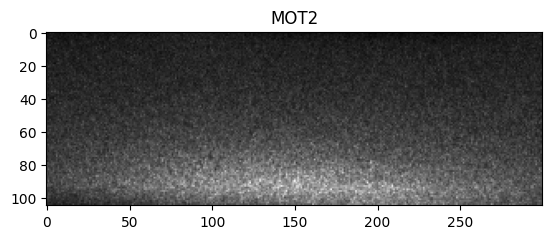

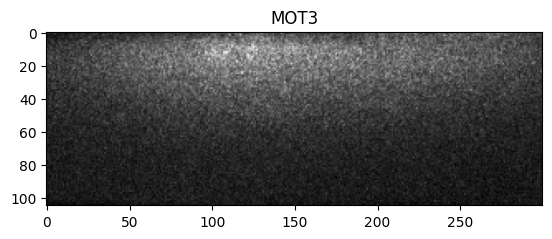

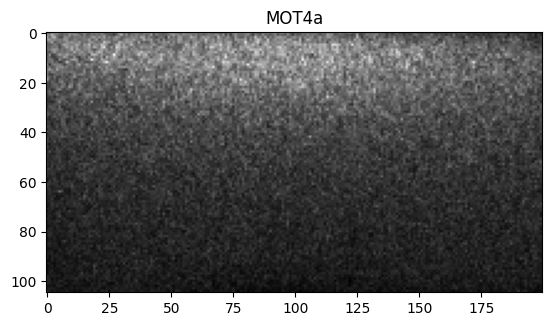

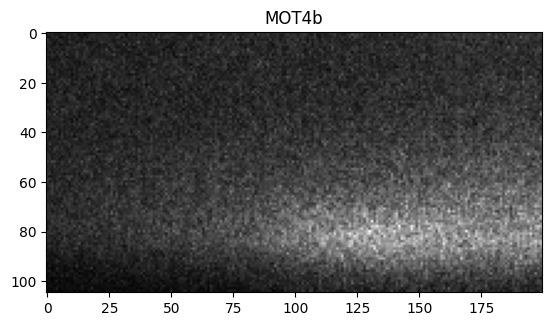

In [347]:
# use 2 ROIs, one for each strip of the macor tube where the most scattering from
# the on-chip MOT beams occurs

# MOT1
image = lucaMOTdata[1,2][230:335,450:750]
plt.imshow(image, cmap='gray')
plt.title(f"MOT1")
plt.show()

# MOT2 dh=212
image = lucaMOTdata[1,3][625:730,450:750]
plt.imshow(image, cmap='gray')
plt.title(f"MOT2")
plt.show()

# MOT3 
image = lucaMOTdata[1,4][230:335,450:750]
plt.imshow(image, cmap='gray')
plt.title(f"MOT3")
plt.show()

# scattering from MOT4 is weak, so use two ROIs
# MOT4a
image = lucaMOTdata[1,5][230:335,200:400]
plt.imshow(image, cmap='gray')
plt.title(f"MOT4a")
plt.show()
# MOT4b
image = lucaMOTdata[1,5][635:740,350:550]
plt.imshow(image, cmap='gray')
plt.title(f"MOT4b")
plt.show()

# # MOT5
# image = lucaMOTdata[1,0][200:450,620:700]
# plt.imshow(image, cmap='gray')
# plt.title(f"MOT5")
# plt.show()

# # MOT6
# image = lucaMOTdata[1,1][200:450,620:700]
# plt.imshow(image, cmap='gray')
# plt.title(f"MOT6")
# plt.show()

# # the MOT itself
# image = lucaMOTdata[1,6][290:340,290:340]
# plt.imshow(image, cmap='gray')
# plt.title(f"The MOT")
# plt.show()

In [350]:
lucadata_len = len(lucaMOTdata)
len(lucaMOTdata), len(MOTdata[0][23:]), len(counts_Hz)

(1440, 2859, 2880)

### plot data from Femto and Thorlabs fW detectors, and from camera ROIs

In [375]:
# Luca data - sum the scattering from the ROIs and normalize to the mean of each
colors = ['darkred','darkviolet','darkorange','dodgerblue','teal','crimson','indigo']
# for label,data,color in zip(labels,MOTdata,colors):
lucaMOT1_data = lucaMOTdata[:,2,230:335,450:750]
lucaMOT2_data = lucaMOTdata[:,3,625:730,450:750]
lucaMOT3_data = lucaMOTdata[:,4,230:335,450:750]
lucaMOT4a_data = lucaMOTdata[:,5,230:335,200:400]
lucaMOT4b_data = lucaMOTdata[:,5,635:740,350:550]
# lucaMOT5_data = lucaMOTdata[:,0,200:450,620:700]
# lucaMOT6_data = lucaMOTdata[:,1,200:450,620:700]

y1pts = np.array([np.sum(lucaMOT1_data[i]) for i in range(lucadata_len)],dtype=float)
y1pts /= np.mean(y1pts)
y2pts = np.array([np.sum(lucaMOT2_data[i]) for i in range(lucadata_len)],dtype=float)
y2pts /= np.mean(y2pts)
y3pts = np.array([np.sum(lucaMOT3_data[i]) for i in range(lucadata_len)],dtype=float)
y3pts /= np.mean(y3pts)
y4pts = np.array([np.sum(lucaMOT4a_data[i])+np.sum(lucaMOT4b_data[i])
                  for i in range(lucadata_len)],dtype=float)
y4pts /= np.mean(y4pts)
# y5pts = np.array([np.sum(lucaMOT5_data[i]) for i in range(lucadata_len)],dtype=float)
# y5pts /= np.mean(y5pts)
# y6pts = np.array([np.sum(lucaMOT6_data[i]) for i in range(lucadata_len)],dtype=float)
# y6pts /= np.mean(y6pts)
xpts = range(len(y4pts))
    

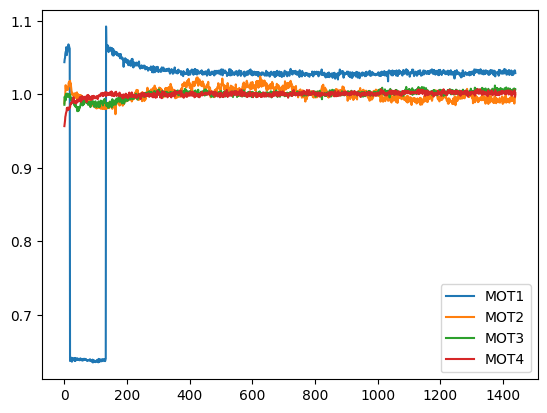

In [353]:
plt.plot(y1pts,label='MOT1')
plt.plot(y2pts,label='MOT2')
plt.plot(y3pts,label='MOT3')
plt.plot(y4pts,label='MOT4')
plt.legend()

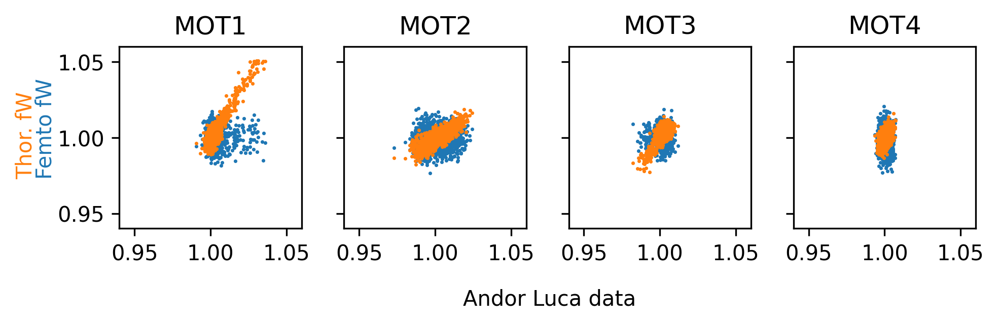

In [411]:
# plot each beam pair in its own subplot

labels = [f'MOT{i+1}' for i in range(4)]+['switchyard_in']
fig,axes = plt.subplots(ncols=4,dpi=300,sharey=True)
MOTaxes = axes
start_at = 150

for label,data_Femto_fW,data_Thor_fW,data_luca,color,ax in zip(
    labels,MOTdata[:4],[MOT1_Thor/1.04,MOT2_Thor,MOT3_Thor,MOT4_Thor],[y1pts-0.027,y2pts,y3pts,y4pts,y5pts,y6pts],colors,MOTaxes):

    ax.set_title(label)
    ax.scatter(data_luca[start_at:], data_Femto_fW[start_at:lucadata_len] ,s=0.5)
    ax.scatter(data_luca[start_at:], data_Thor_fW[start_at:lucadata_len], s=0.5)
     
    # det_str = ',Femto fW' if float(label[-1]) < 5 else ',i2v'
    # ax.plot(data_Femto_fW[:lucadata_len], color=color, label=label+det_str,linewidth=0.5)
    # det_str = ',Thor fW' if float(label[-1]) < 5 else ',i2v'
    # ax.plot(data_Thor_fW[:lucadata_len], color='red', label=label+det_str,linewidth=0.5,linestyle='-')
    # ax.plot(data_luca, color=lighten_color(color,0.3), label=label+',Luca',linewidth=0.5)
    ax.set_ylim((0.94,1.06))
    ax.set_xlim((0.94,1.06))
    ax.set_aspect('equal')
    # ax.legend(loc=(1.05,0.1))

fig.text(0.44,0.27, 'Andor Luca data')
fig.text(-0.02,0.45, 'Thor. fW',rotation=90,color='tab:orange')
fig.text(-0.0,0.45, 'Femto fW',rotation=90,color='tab:blue')

fig.tight_layout()

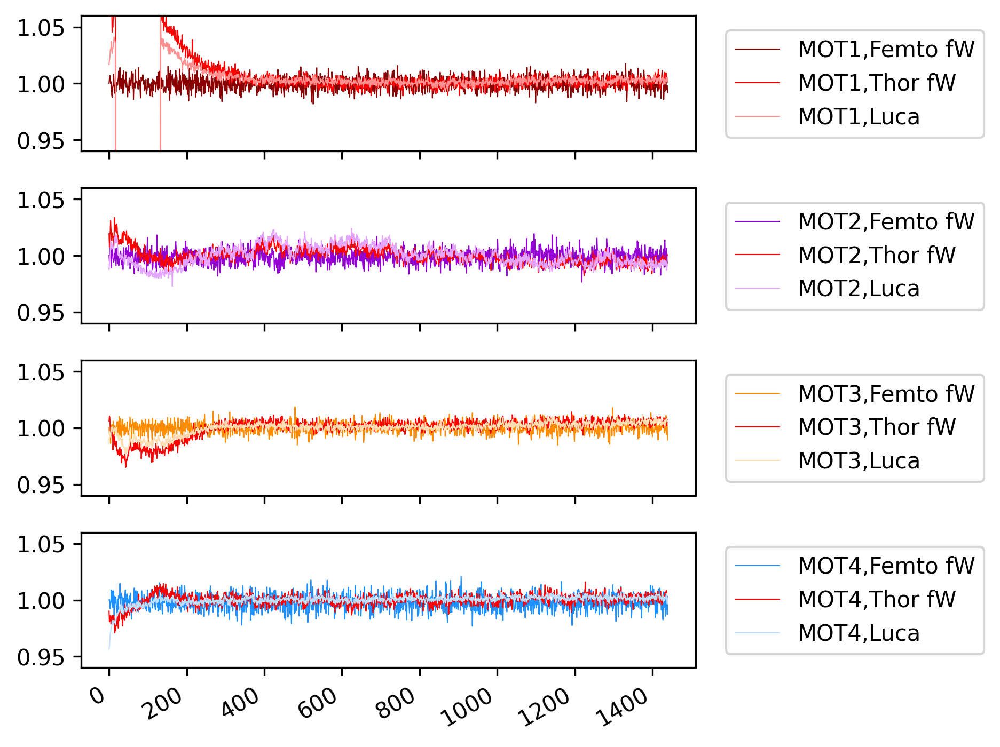

In [381]:
# plot each beam pair in its own subplot

labels = [f'MOT{i+1}' for i in range(4)]+['switchyard_in']
fig,axes = plt.subplots(nrows=4,dpi=300)
MOTaxes = axes
# axSPCM = axes[-1]

for label,data_Femto_fW,data_Thor_fW,data_luca,color,ax in zip(
    labels,MOTdata[:4],[MOT1_Thor/1.04,MOT2_Thor,MOT3_Thor,MOT4_Thor],[y1pts-0.027,y2pts,y3pts,y4pts,y5pts,y6pts],colors,MOTaxes):
    # xpts = range(len(data_Femto_fW))
#     ax.scatter(xpts, ypts, color=color,s=0.1)
    det_str = ',Femto fW' if float(label[-1]) < 5 else ',i2v'
    ax.plot(data_Femto_fW[:lucadata_len], color=color, label=label+det_str,linewidth=0.5)
    det_str = ',Thor fW' if float(label[-1]) < 5 else ',i2v'
    ax.plot(data_Thor_fW[:lucadata_len], color='red', label=label+det_str,linewidth=0.5,linestyle='-')
    ax.plot(data_luca, color=lighten_color(color,0.3), label=label+',Luca',linewidth=0.5)
    ax.set_ylim((0.94,1.06))
    ax.legend(loc=(1.05,0.1))
# ax.get_xaxis().set_visible(False)
    
ax.legend(loc=(1.05,0.1))
# ax.get_xaxis().set_visible(False)
# counts_steps = len(counts_Hz)

# hr0 = 17
# min0 = 10
# timestamps = [((hr0+(min0+i)//60)%24,(min0+i)%60) for i in range(900)]

# SPCM data
# axSPCM.plot(range(counts_steps),counts_Hz,label='SPCM counts',linewidth=0.5)
# ax2.set_xticks(timestamps)
plt.gcf().autofmt_xdate()
# axSPCM.legend(loc=(1.05,0.4))
fig.tight_layout()

## 2023.09.15
Summary of the results below:
The data still shows a large qualitative disagreement between the fluctuations on the MOT beams measured with the fW and those measured with the Andor Luca. To rule out region dependent fluctuations in the camera's gain, I plotted the counts in the ROIs for MOT1, MOT2, and MOT3 when only MOT5 was on, when those regions are mostly dark. This was done because we assume the i2V gain does not fluctuate, and MOT5 is stable to better than 1% on the i2V and to ~ 1% on the Luca. However, the fluctuation in gain seen from those shots is only ~ 1%, and is correlated for the three ROIs and MOT6. There are three conclusions from this: 1) MOT5 and MOT6 are likely drifting in position, because we see a slow fluctuation on the Luca for these beams, despite a stable signal on the i2Vs 2) the drift in MOT5's position is most of the variation I saw in the "background" for MOT1,2,3 so the camera gain is stable, and 3) the drift seen by the other beams may be due to drift in the modes supported by the MM fiber due to temperature dependent strain. This last point can be checked by monitoring scattering from MOT5 and MOT6 into the fW detector.

### estimate microns/pixel with known dimensions
use the image from 09/13 since we have not changed the camera position since then.

In [4]:
filenames = [
            "MOTTemperature_size_reference.tif"
]

tifstack = np.array(list(itertools.chain(*[tifffile.imread(os.path.join(results,"2023-09-13\\17",f))
    for f in filenames
]))) # flattening tifstackList

<tifffile.TiffTag 4935 @1015784> coercing invalid ASCII to bytes, due to UnicodeDecodeError('charmap', b'\x8f', 0, 1, 'character maps to <undefined>')


In [5]:
tifstack.shape

(1002, 1004)

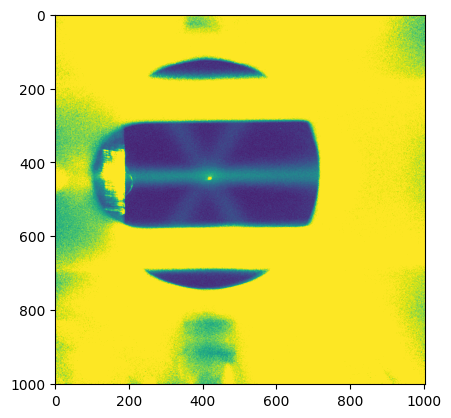

In [6]:
plt.imshow(tifstack)

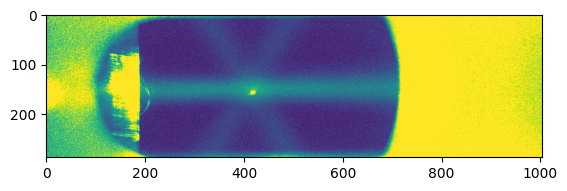

In [7]:
plt.imshow(tifstack[287:575])

In [8]:
pixels_per_um = (575-287)/5600 # the slot width is 5.6 mm
pixels_per_um, 1/pixels_per_um

(0.05142857142857143, 19.444444444444446)

In [9]:
ppm = lambda pixels: 1e-6*pixels/pixels_per_um # pixels per meter, not parts per million

### import data and experiment settings

this data was taken after I improved the MOT beam feedback by moving from 4 iterations averaging over 4 measurements each, to 10 and 15, respectively. I also tuned the P coefficients to improve convergence time and reduce oscillation. integral was zero or almost zero on all beams, but it is suspected that integral will not help when doing only 10 feedback steps per call of AOMPowerStabilizer.run()-- at the first step, there is no historical error, at the second step only one error, and so on. and referencing the error on the previous feedback loop, e.g. from 5 s in the past, is not meaningful.

In [20]:
date_dir = "2023-09-15\\17"

f = h5py.File(os.path.join(results, date_dir, '000005452-MOTMonitorEverything.h5'))
[(i,x) for i,x in enumerate(f['datasets'].values())]

[(0, <HDF5 dataset "AOM_A1_ON": shape (), type "|b1">),
 (1, <HDF5 dataset "AOM_A1_power": shape (), type "<f8">),
 (2, <HDF5 dataset "AOM_A2_ON": shape (), type "|b1">),
 (3, <HDF5 dataset "AOM_A2_power": shape (), type "<f8">),
 (4, <HDF5 dataset "AOM_A3_ON": shape (), type "|b1">),
 (5, <HDF5 dataset "AOM_A3_power": shape (), type "<f8">),
 (6, <HDF5 dataset "AOM_A4_ON": shape (), type "|b1">),
 (7, <HDF5 dataset "AOM_A4_power": shape (), type "<f8">),
 (8, <HDF5 dataset "AOM_A5_ON": shape (), type "|b1">),
 (9, <HDF5 dataset "AOM_A5_power": shape (), type "<f8">),
 (10, <HDF5 dataset "AOM_A6_ON": shape (), type "|b1">),
 (11, <HDF5 dataset "AOM_A6_power": shape (), type "<f8">),
 (12, <HDF5 dataset "Cooling_DP_AOM_ON": shape (), type "|b1">),
 (13, <HDF5 dataset "Cooling_SP_AOM_ON": shape (), type "|b1">),
 (14, <HDF5 dataset "FORT_AOM_ON": shape (), type "|b1">),
 (15, <HDF5 dataset "FORT_monitor": shape (2882,), type "<f8">),
 (16, <HDF5 dataset "MOT1_monitor": shape (2882,), typ

In [26]:
MOTdata = [np.array(f['datasets'][f'MOT{i+1}_monitor']) for i in range(6)] +  [np.array(f['datasets']['MOT_switchyard_monitor'])]
counts_Hz = np.array(f['datasets']['SPCM_count_rate_Hz'])[1:]

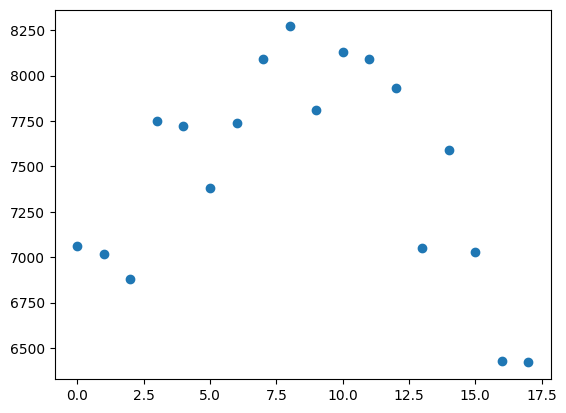

In [27]:
l=18
plt.scatter(range(l),counts_Hz[:l])

In [18]:
Xmax = 9
filenames = ["MOTStabilityCheck_20230915.tif"] + [f"MOTStabilityCheck_X{i}_20230915.tif" for i in range(2,Xmax+1)]

tifstack = np.array(list(itertools.chain(*[tifffile.imread(os.path.join(results,date_dir,f))
    for f in filenames
]))) # flattening tifstackList

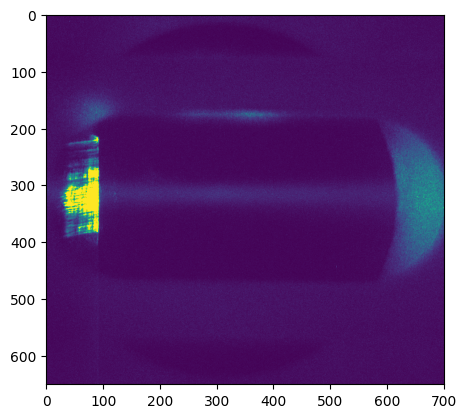

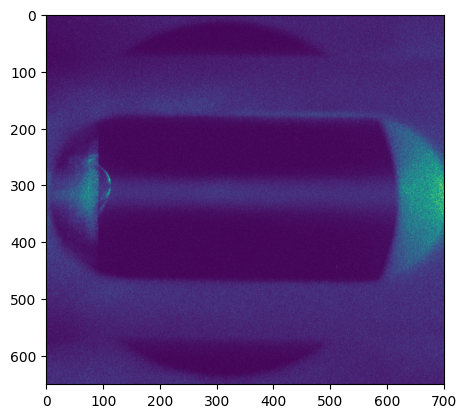

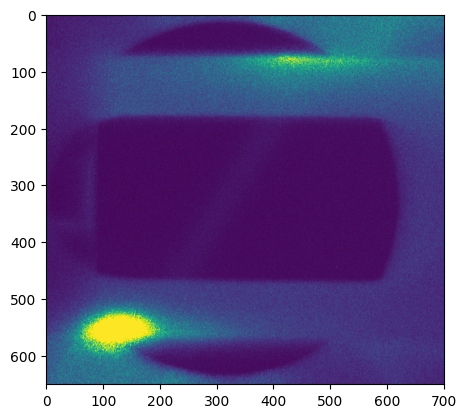

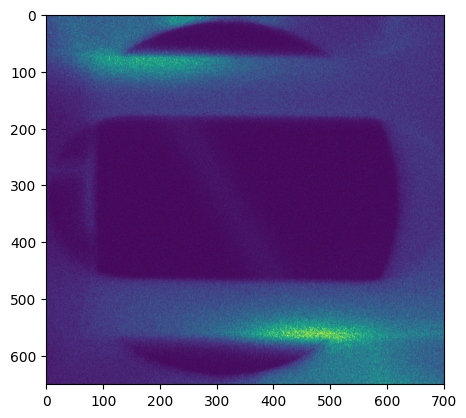

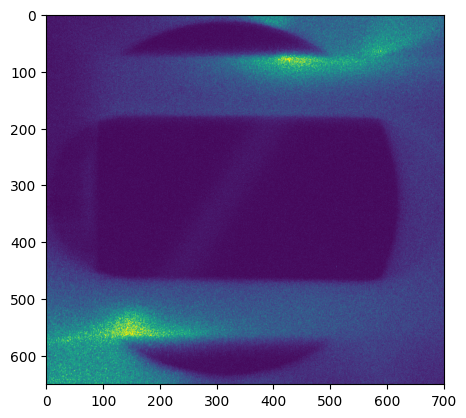

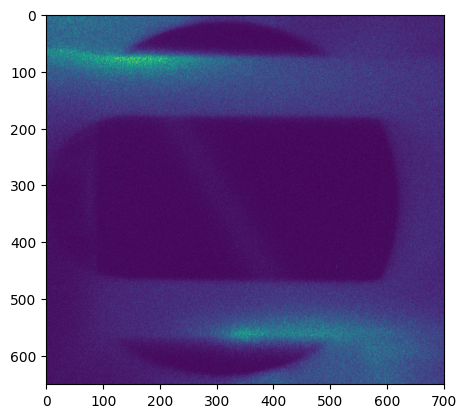

In [36]:
for i in range(6,12):
    plt.imshow(tifstack[i])
    plt.show()

In [37]:
len(tifstack[6:])%7

0

In [42]:
tifstack.shape

(20019, 651, 701)

In [43]:
lucaMOTdata = np.reshape(tifstack[6:],(-1,7,*tifstack.shape[1:]))

In [44]:
lucaMOTdata.shape

(2859, 7, 651, 701)

In [45]:
lucadata_len = lucaMOTdata.shape[0]

TODO: get the data from origin

we were monitoring the coil monitor outputs and zotino using the Labjack T7 and GOOD logger.
however, because the file was large, the good reader froze and I had to remote into the server
that runs origin to get the data. 

I wrote a sql command to get the data, a bashscript to run the sql command, and then ran the 
bashscript directing the output to a csv file which I obtained through an scp command. detailed notes
on how to do all this are on the wiki in origin notes.

In [309]:
origin_file = os.path.join(csvdata,"qn_labjack_data_20230908_coil_monitoring.csv")
has_header = True
with open(origin_file, 'r', newline='') as f:
    reader = csv.reader(f, delimiter='\t')
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]
    f.close()

### find ROIs for the MOT beam scattering

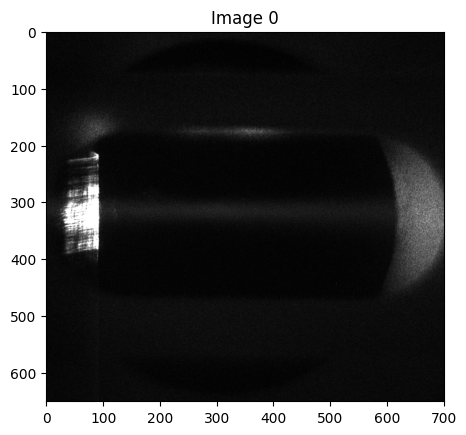

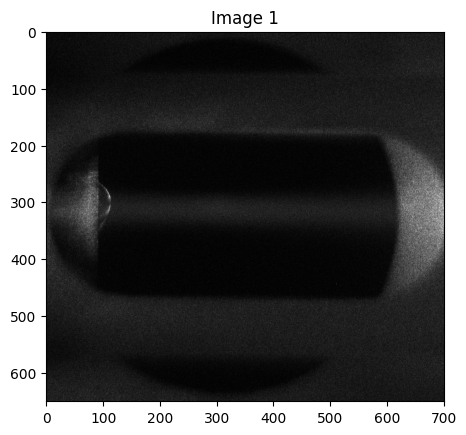

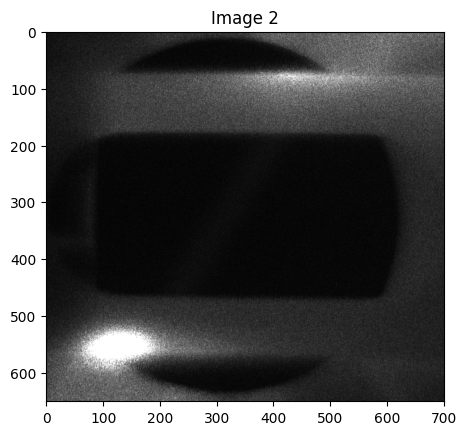

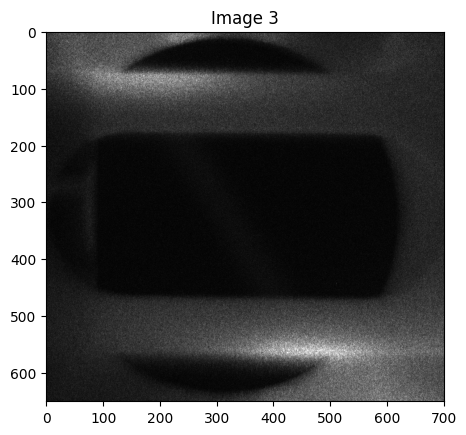

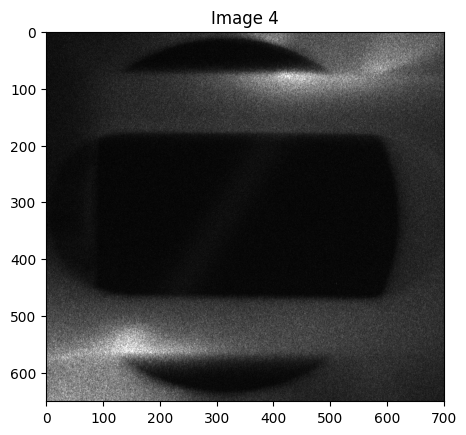

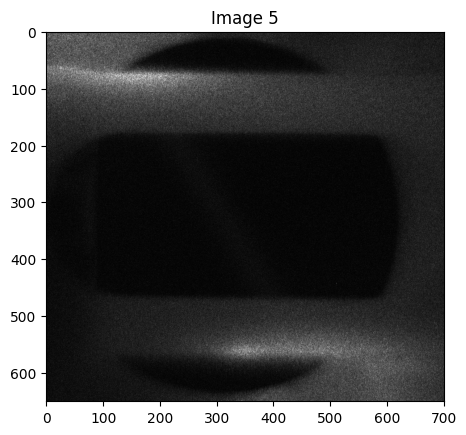

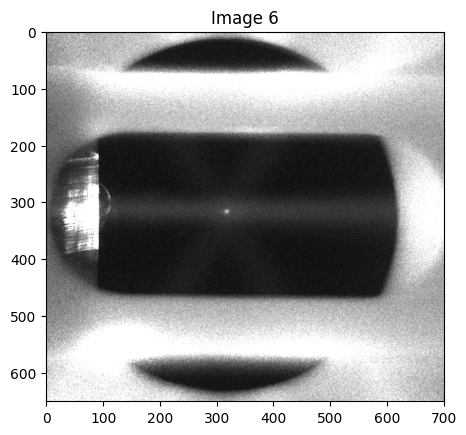

In [202]:
for i in range(0,7):
    image = lucaMOTdata[1,i]
    plt.imshow(image, cmap='gray')
    plt.title(f"Image {i}")
    plt.show()

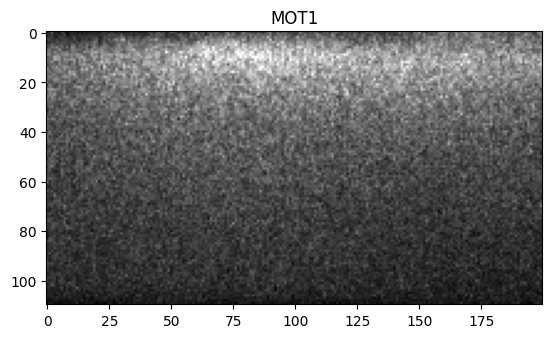

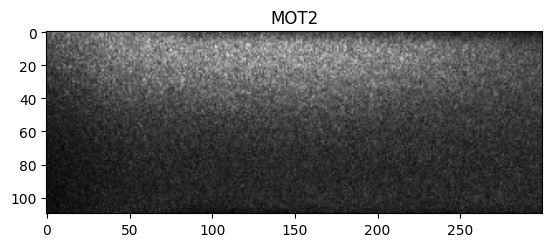

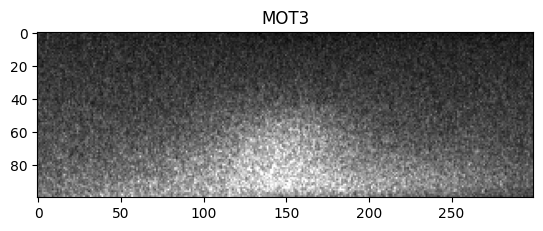

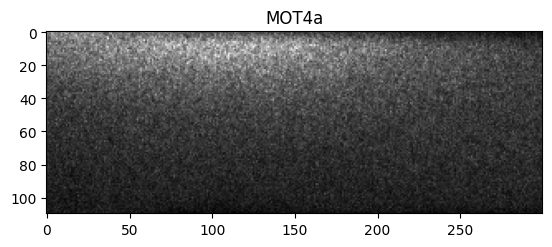

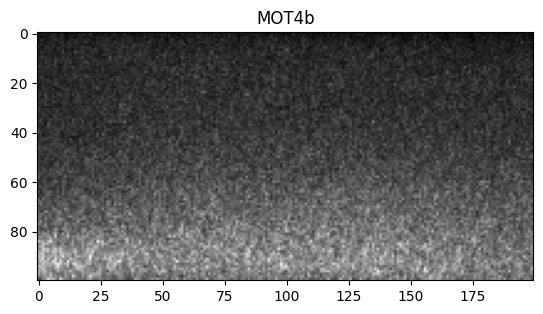

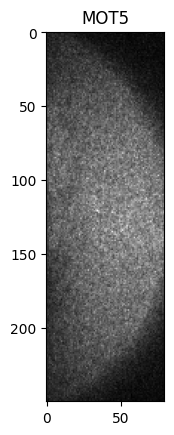

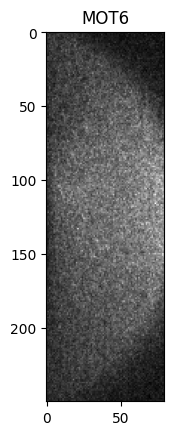

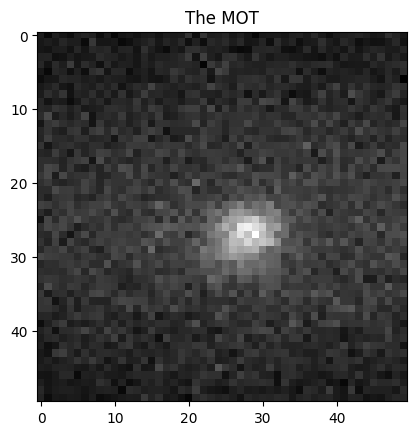

In [227]:
# use 2 ROIs, one for each strip of the macor tube where the most scattering from
# the on-chip MOT beams occurs

# MOT1
image = lucaMOTdata[1,2][70:180,350:550]
plt.imshow(image, cmap='gray')
plt.title(f"MOT1")
plt.show()

# MOT2 dh=212
image = lucaMOTdata[1,3][70:180,50:350]
plt.imshow(image, cmap='gray')
plt.title(f"MOT2")
plt.show()

# MOT3 
image = lucaMOTdata[1,4][470:570,0:300]
plt.imshow(image, cmap='gray')
plt.title(f"MOT3")
plt.show()

# scattering from MOT4 is weak, so use two ROIs
# MOT4a
image = lucaMOTdata[1,5][70:180,50:350]
plt.imshow(image, cmap='gray')
plt.title(f"MOT4a")
plt.show()
# MOT4b
image = lucaMOTdata[1,5][470:570,350:550]
plt.imshow(image, cmap='gray')
plt.title(f"MOT4b")
plt.show()

# MOT5
image = lucaMOTdata[1,0][200:450,620:700]
plt.imshow(image, cmap='gray')
plt.title(f"MOT5")
plt.show()

# MOT6
image = lucaMOTdata[1,1][200:450,620:700]
plt.imshow(image, cmap='gray')
plt.title(f"MOT6")
plt.show()

# the MOT itself
image = lucaMOTdata[1,6][290:340,290:340]
plt.imshow(image, cmap='gray')
plt.title(f"The MOT")
plt.show()

In [74]:
len(lucaMOTdata), len(MOTdata[0][23:]), len(counts_Hz)

(2859, 2859, 2880)

### MOT positional drift

In [228]:
lucaMOTimage_data = lucaMOTdata[:,6,290:340,290:340]

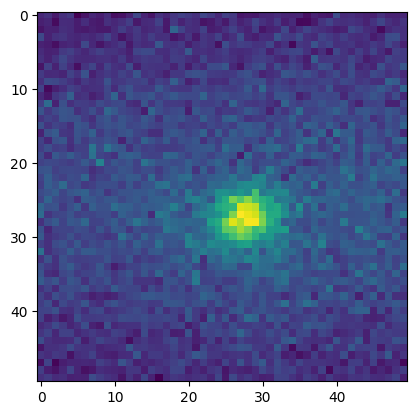

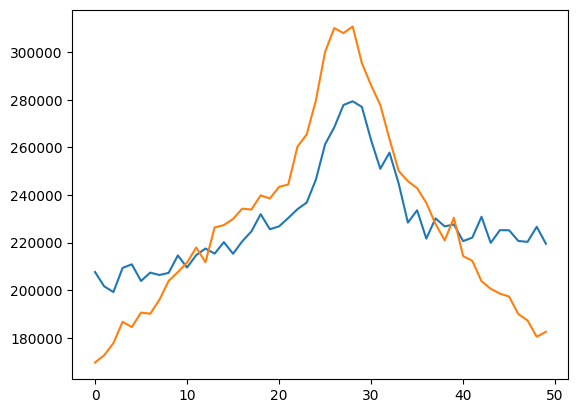

In [231]:
plt.imshow(lucaMOTimage_data[0])
plt.show()
plt.plot(np.sum(lucaMOTimage_data[0], axis=0))
plt.plot(np.sum(lucaMOTimage_data[0], axis=1))

In [240]:
# 1D fits to the projections

waists_x = np.empty(len(lucaMOTimage_data))
positions_x = np.empty(len(lucaMOTimage_data))

waists_y = np.empty(len(lucaMOTimage_data))
positions_y = np.empty(len(lucaMOTimage_data))

x = range(image.shape[0])
y = range(image.shape[1])

def model(x, a, x0, w0, b):
    return a*np.exp(-2*((x-x0)/w0)**2) + b

test_images = [lucaMOTimage_data[i] for i in [1,100,1000,2000]]

# image_stack = test_images
image_stack = lucaMOTimage_data

for i,image in enumerate(image_stack):

    xdata = np.sum(image, axis=0)
    
    # amplitude, x/y0, wx/y, offset
    initial_guess = (80000,25,4,200000)
    upper_bounds = [150000,50,30,250000]
    lower_bounds = [50000,10,2,100000]

    popt, pcov = curve_fit(model, x, xdata, p0=initial_guess, 
                           bounds=[lower_bounds,upper_bounds])

    xdata_fitted = model(x, *popt)

    waists_x[i] = popt[2]
    positions_x[i] = popt[1]
    
    ydata = np.sum(image, axis=1)
    
    # amplitude, x/y0, wx/y, offset
    initial_guess = (80000,25,4,200000)
    upper_bounds = [150000,50,30,250000]
    lower_bounds = [50000,10,2,100000]

    popt, pcov = curve_fit(model, y, ydata, p0=initial_guess, 
                           bounds=[lower_bounds,upper_bounds])

    ydata_fitted = model(y, *popt)
    
    waists_y[i] = popt[2]
    positions_y[i] = popt[1]

    if image_stack is test_images:
        fig, axes = plt.subplots(nrows=2)
        ax,ax2 = axes
        # ax.set_title(f"t={t/ms:.1f}ms, wx, wy = "+
                     # f"{waists_x[-1]/pixels_per_um:.0f}um, {waists_y[-1]/pixels_per_um:.0f}um")
        ax.plot(x,xdata,label='y projection')
        ax.plot(x,xdata_fitted,label='y fit')
        ax.legend()
        ax2.plot(y,ydata,label='x projection')
        ax2.plot(y,ydata_fitted,label='x fit')
        ax2.legend()
        plt.show()

somewhat surprisingly, the direction with far more drift is x, which is the direction along the parabolic mirror's axis.
the force of the in-plane MOT beams is weaker along that direction, though if the external beams are much stronger than
the on-chip ones, then the observed fluctuations along x could be largely due to positional shifts of those beams.

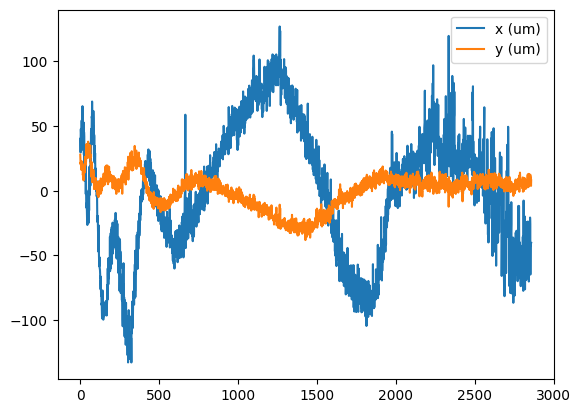

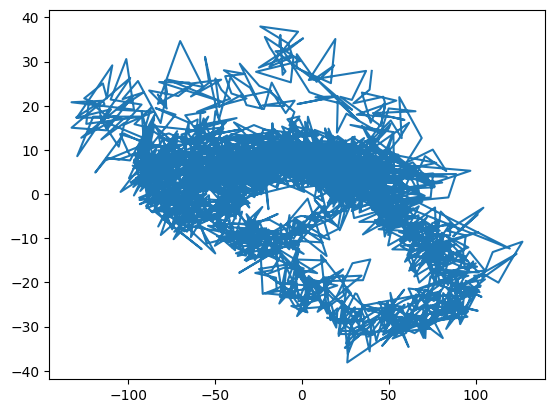

In [250]:
plt.plot((positions_x - np.mean(positions_x))/pixels_per_um,label='x (um)')
plt.plot((positions_y - np.mean(positions_y))/pixels_per_um,label='y (um)')
plt.legend()
plt.show()
plt.plot((positions_x - np.mean(positions_x))/pixels_per_um,(positions_y - np.mean(positions_y))/pixels_per_um)

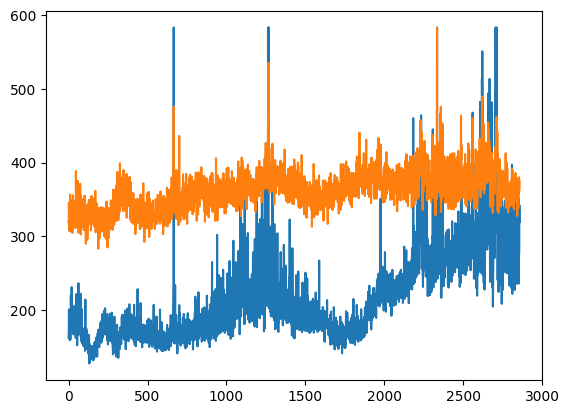

In [266]:
plt.plot(waists_x/pixels_per_um,label='wx (um)')
plt.plot(waists_y/pixels_per_um,label='wy (um)')

### detect camera drift in y
the drift is << 1 pixel

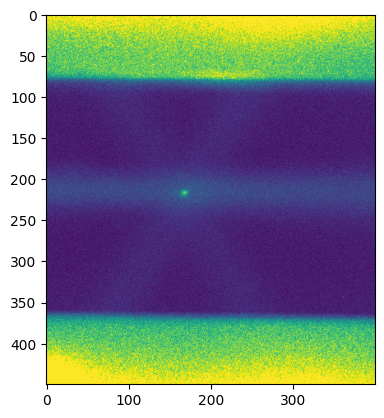

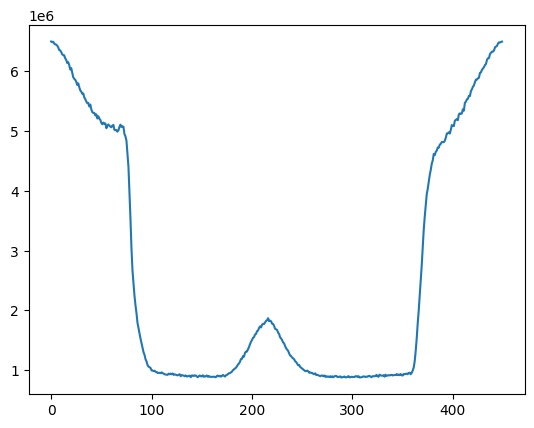

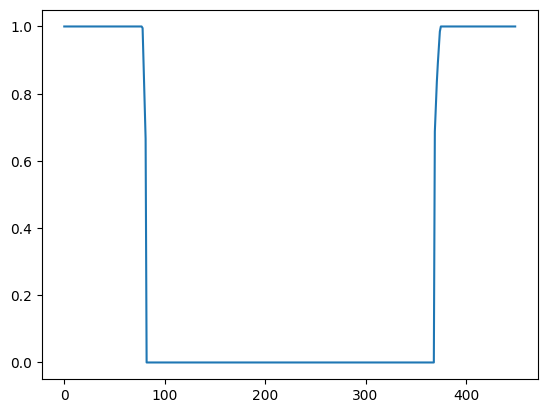

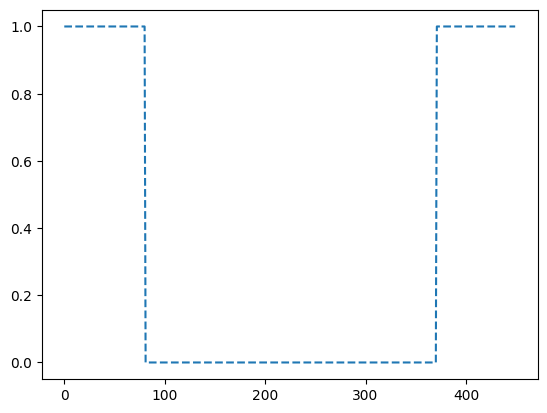

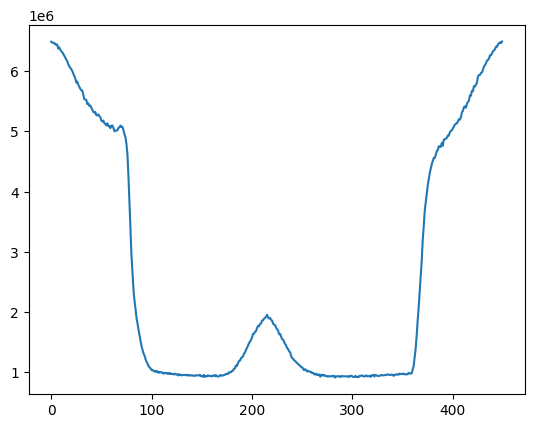

...

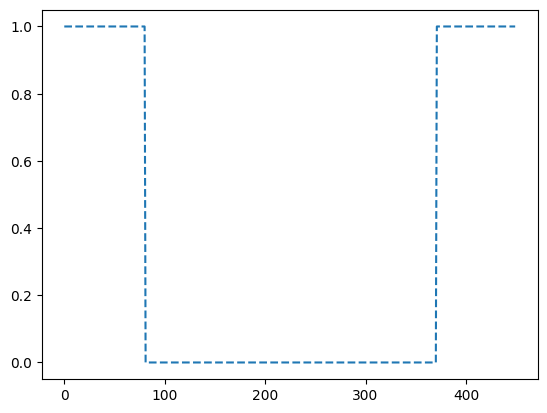

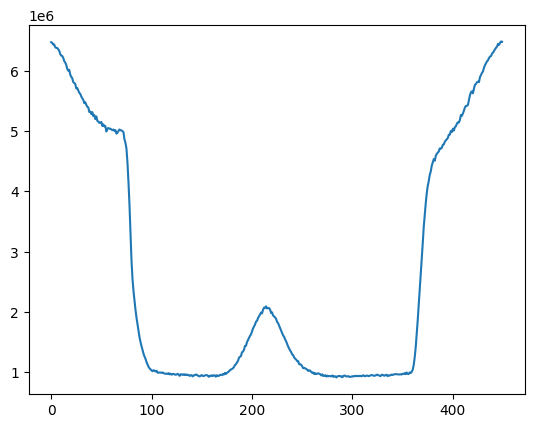

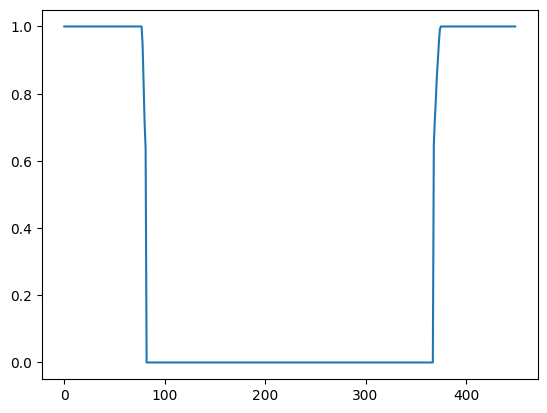

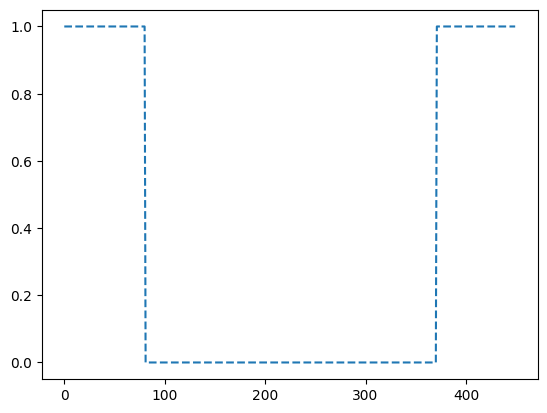

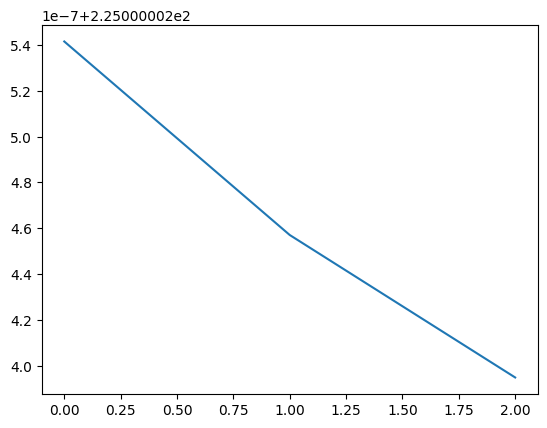

In [201]:
# fit a square function to the slot of the mirror tube to check if the camera is drifting
plt.imshow(lucaMOTdata[1,6,100:550,150:550])
plt.show()

initial_guess = (225,290)
upper_bounds = [270,320]
lower_bounds = [170,200]

def model(x, x0, a):
    # if x < x0 - a/2:
    #     return 1.0
    # elif x > x0 + a/2:
    #     return 1.0
    # else:
    #     return 0.0

    y = np.zeros(len(x))
    y += [x < x0 - a/2][0]
    y += [x > x0 + a/2][0]
    return y
    
    # return np.piecewise(x, [x < x0 - a/2, x > x0 + a/2, x0 - a/2 < x < x0 + a/2], [1.0, 1.0, 0.0])

slot_x0 = []
slot_a = []
for i in [1,100,1000]: #range(len(lucaMOTdata)):
    slot_data = np.sum(lucaMOTdata[i,6,100:550,150:550],axis=1).astype(float)
    plt.plot(slot_data)
    plt.show()
    slot_data[slot_data > 4e6] = 4e6
    slot_data[slot_data < 2.5e6] = 0
    slot_data /= np.amax(slot_data)
    plt.plot(slot_data)
    plt.show()
    x = np.arange(len(slot_data))
    popt, pcov = curve_fit(model, x, slot_data, p0=initial_guess, 
                       bounds=[lower_bounds,upper_bounds])
    
    slot_x0.append(popt[0])
    slot_a.append(popt[1])

    plt.plot(x, model(x, *popt),linestyle='--')
    plt.show()

# plt.plot(model(x,225,290))
plt.plot(slot_x0)

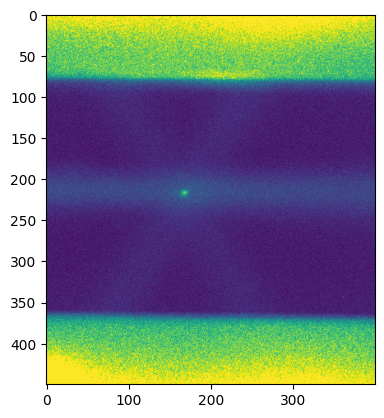

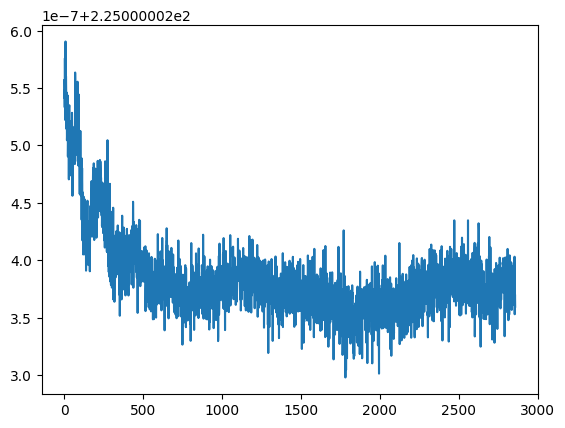

In [161]:
# fit a square function to the slot of the mirror tube to check if the camera is drifting
plt.imshow(lucaMOTdata[1,6,100:550,150:550])
plt.show()

initial_guess = (225,290)
upper_bounds = [270,320]
lower_bounds = [170,200]

def model(x, x0, a):
    # if x < x0 - a/2:
    #     return 1.0
    # elif x > x0 + a/2:
    #     return 1.0
    # else:
    #     return 0.0

    y = np.zeros(len(x))
    y += [x < x0 - a/2][0]
    y += [x > x0 + a/2][0]
    return y
    
    # return np.piecewise(x, [x < x0 - a/2, x > x0 + a/2, x0 - a/2 < x < x0 + a/2], [1.0, 1.0, 0.0])

slot_x0 = []
slot_a = []
for i in []:range(len(lucaMOTdata)):
    slot_data = np.sum(lucaMOTdata[i,6,100:550,150:550],axis=1).astype(float)
    slot_data[slot_data > 4e6] = 4e6
    slot_data[slot_data < 2.5e6] = 0
    slot_data /= np.amax(slot_data)
    # plt.plot(slot_data)
    x = np.arange(len(slot_data))
    popt, pcov = curve_fit(model, x, slot_data, p0=initial_guess, 
                       bounds=[lower_bounds,upper_bounds])
    
    slot_x0.append(popt[0])
    slot_a.append(popt[1])

    # plt.plot(x, model(x, *popt),linestyle='--')
# plt.show()

# plt.plot(model(x,225,290))
plt.plot(slot_x0)

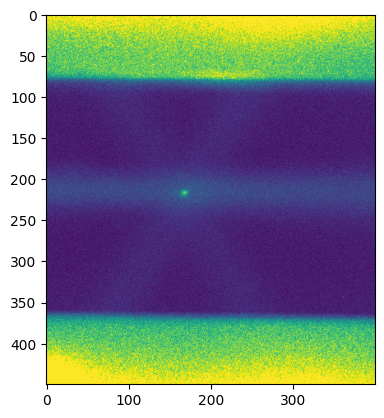

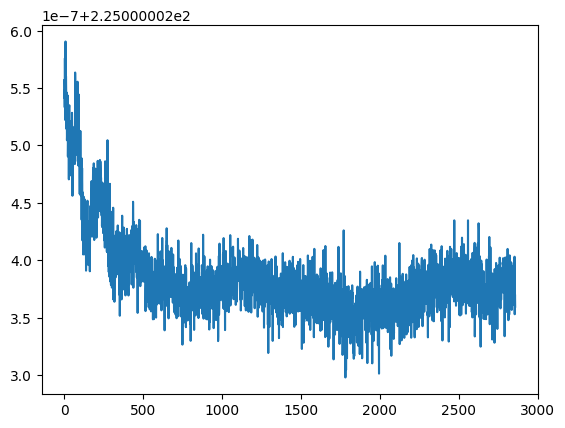

In [161]:
# fit a square function to the slot of the mirror tube to check if the camera is drifting
plt.imshow(lucaMOTdata[1,6,100:550,150:550])
plt.show()

initial_guess = (225,290)
upper_bounds = [270,320]
lower_bounds = [170,200]

def model(x, x0, a):
    # if x < x0 - a/2:
    #     return 1.0
    # elif x > x0 + a/2:
    #     return 1.0
    # else:
    #     return 0.0

    y = np.zeros(len(x))
    y += [x < x0 - a/2][0]
    y += [x > x0 + a/2][0]
    return y
    
    # return np.piecewise(x, [x < x0 - a/2, x > x0 + a/2, x0 - a/2 < x < x0 + a/2], [1.0, 1.0, 0.0])

slot_x0 = []
slot_a = []
for i in []:range(len(lucaMOTdata)):
    slot_data = np.sum(lucaMOTdata[i,6,100:550,150:550],axis=1).astype(float)
    slot_data[slot_data > 4e6] = 4e6
    slot_data[slot_data < 2.5e6] = 0
    slot_data /= np.amax(slot_data)
    # plt.plot(slot_data)
    x = np.arange(len(slot_data))
    popt, pcov = curve_fit(model, x, slot_data, p0=initial_guess, 
                       bounds=[lower_bounds,upper_bounds])
    
    slot_x0.append(popt[0])
    slot_a.append(popt[1])

    # plt.plot(x, model(x, *popt),linestyle='--')
# plt.show()

# plt.plot(model(x,225,290))
plt.plot(slot_x0)

In [168]:
min(slot_x0), max(slot_x0)

(225.00000229803862, 225.00000259048235)

In [146]:
# plt.plot(x, model(x,*initial_guess))
y = np.zeros(len(x))
x0,a = initial_guess
y += [x < x0 - a/2][0]
y += [x > x0 + a/2][0]

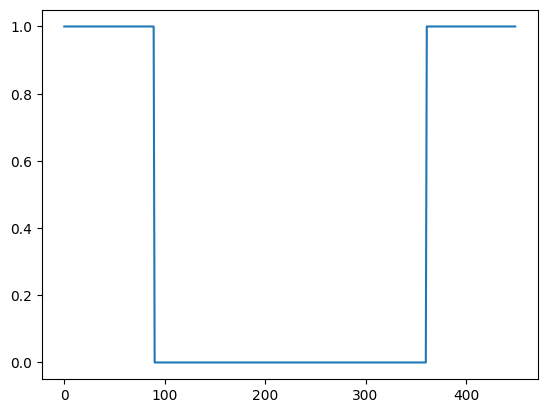

In [147]:
plt.plot(y)

### detect camera drift in x
the drift is << 1 pixel

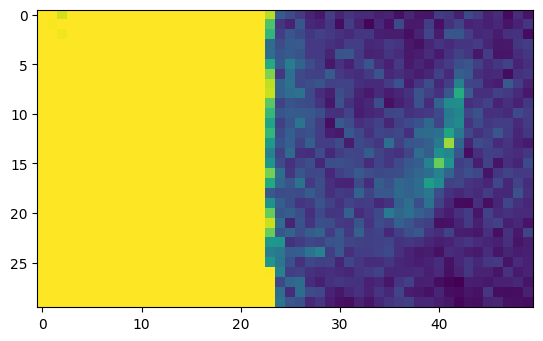

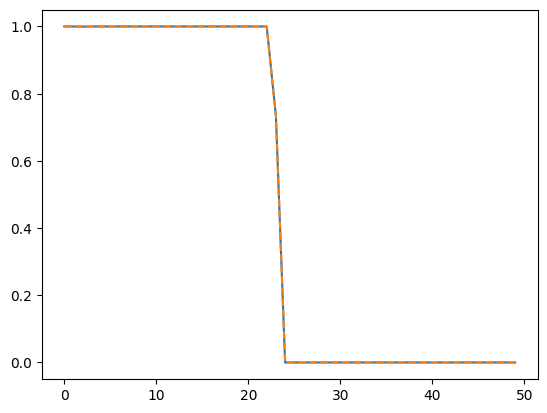

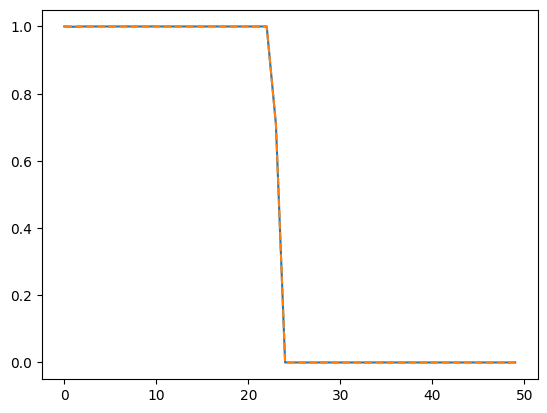

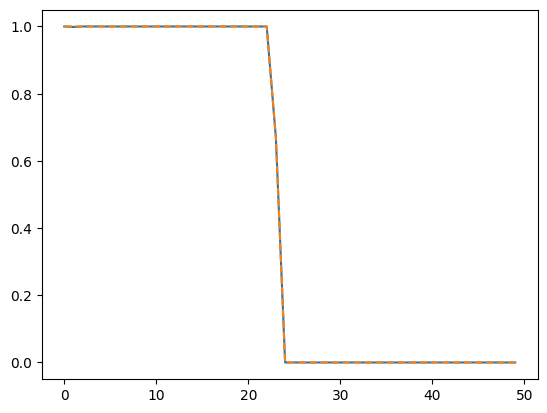

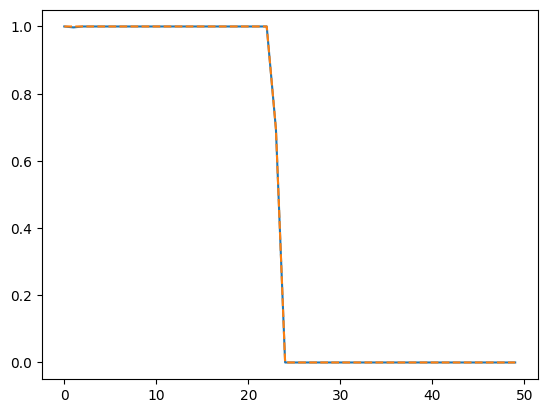

...

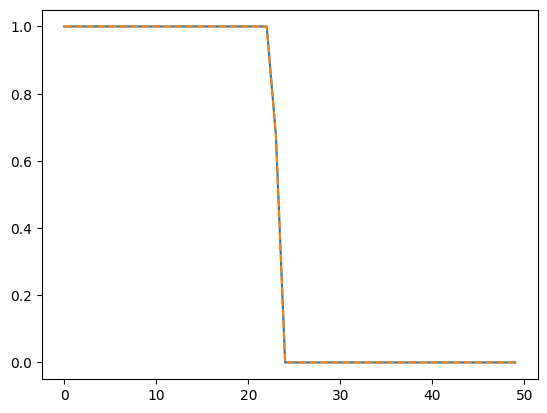

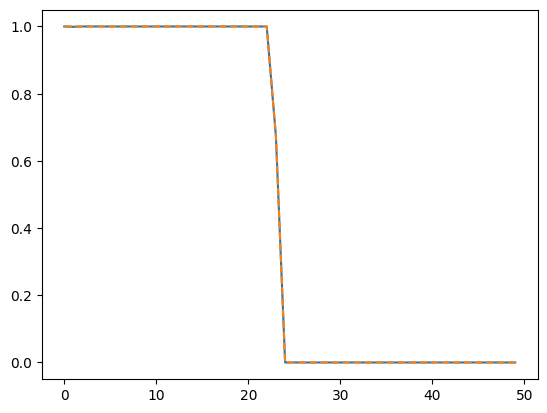

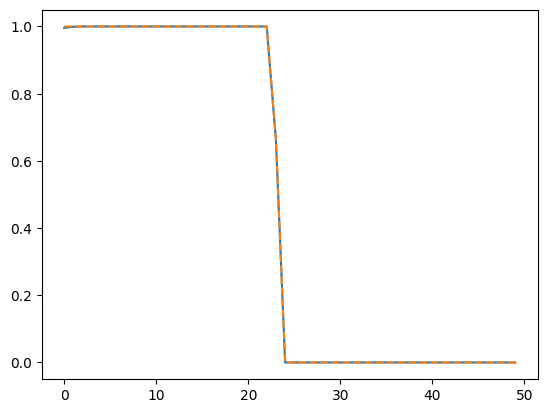

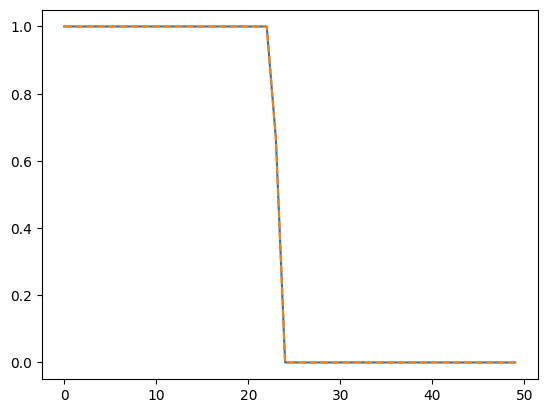

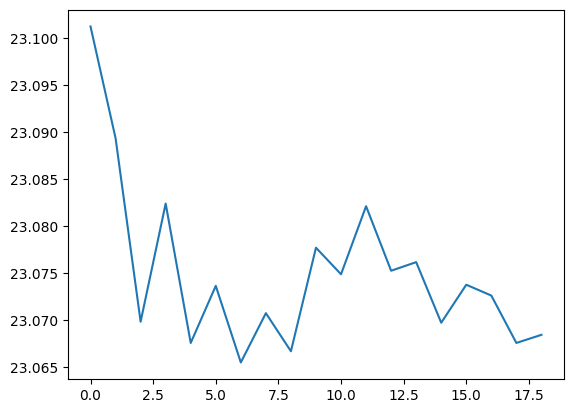

In [196]:
# fit a step function to the edge of the mirror to check if the camera is drifting
plt.imshow(lucaMOTdata[1,6,300:330,70:120])
plt.show()

initial_guess = (23,4)
upper_bounds = [30,10]
lower_bounds = [20,1]

def model(x, x0, tau):

    return 1/(1+np.exp((x-x0)*tau))
    
slot_x0 = []
for i in np.arange(100,2000,100):
    slot_data = np.sum(lucaMOTdata[i,6,300:330,70:120],axis=0).astype(float)
    slot_data[slot_data < 2.2e5] = 0
    slot_data /= np.amax(slot_data)
    plt.plot(slot_data)
    x = np.arange(len(slot_data))
    popt, pcov = curve_fit(model, x, slot_data, p0=initial_guess,
                       bounds=[lower_bounds,upper_bounds])
    
    slot_x0.append(popt[0])

    plt.plot(x, model(x, *popt),linestyle='--')
    plt.show()

# plt.plot(model(x,23,4),label='fit')
# plt.legend()
plt.plot(slot_x0)

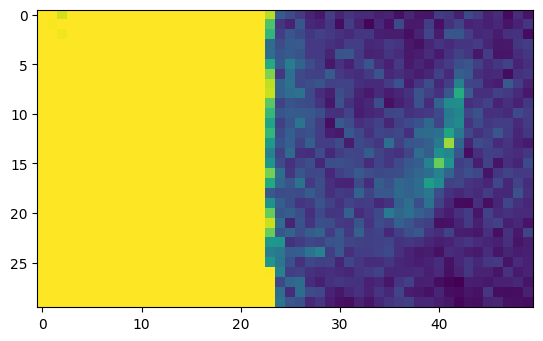

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


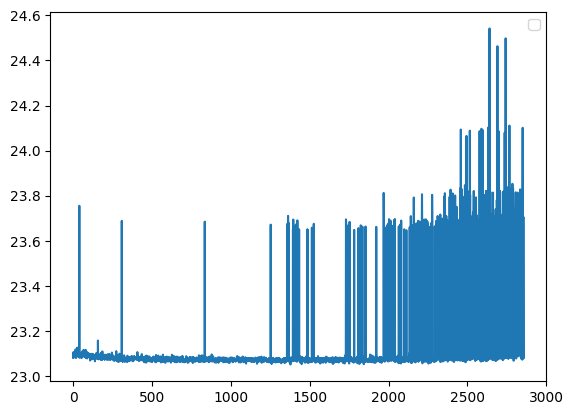

In [195]:
# fit a step function to the edge of the mirror to check if the camera is drifting
plt.imshow(lucaMOTdata[1,6,300:330,70:120])
plt.show()

initial_guess = (23,4)
upper_bounds = [30,10]
lower_bounds = [20,1]

def model(x, x0, tau):

    return 1/(1+np.exp((x-x0)*tau))
    
    # return np.piecewise(x, [x < x0 - a/2, x > x0 + a/2, x0 - a/2 < x < x0 + a/2], [1.0, 1.0, 0.0])

slot_x0 = []
for i in range(len(lucaMOTdata)): # [1,100,1000]: 
    slot_data = np.sum(lucaMOTdata[i,6,300:330,70:120],axis=0).astype(float)
    slot_data[slot_data < 2.2e5] = 0
    slot_data /= np.amax(slot_data)
    # plt.plot(slot_data)
    x = np.arange(len(slot_data))
    popt, pcov = curve_fit(model, x, slot_data, p0=initial_guess,
                       bounds=[lower_bounds,upper_bounds])
    
    slot_x0.append(popt[0])
    # slot_a.append(popt[1])

    # plt.plot(x, model(x, *popt),linestyle='--')
# plt.show()

# plt.plot(model(x,23,4),label='fit')
# plt.legend()
plt.plot(slot_x0)

### plot fW, Luca, SPCM, and MOT position datasets alongside each other

In [209]:
# Luca data - sum the scattering from the ROIs and normalize to the mean of each
colors = ['darkred','darkviolet','darkorange','dodgerblue','teal','crimson','indigo']
# for label,data,color in zip(labels,MOTdata,colors):
lucaMOT1_data = lucaMOTdata[:,2,70:180,350:550]
lucaMOT2_data = lucaMOTdata[:,3,70:180,50:350]
lucaMOT3_data = lucaMOTdata[:,4,470:570,0:300]
lucaMOT4a_data = lucaMOTdata[:,5,70:180,50:350]
lucaMOT4b_data = lucaMOTdata[:,5,470:570,350:550]
lucaMOT5_data = lucaMOTdata[:,0,200:450,620:700]
lucaMOT6_data = lucaMOTdata[:,1,200:450,620:700]

y1pts = np.array([np.sum(lucaMOT1_data[i]) for i in range(lucadata_len)],dtype=float)
y1pts /= np.mean(y1pts)
y2pts = np.array([np.sum(lucaMOT2_data[i]) for i in range(lucadata_len)],dtype=float)
y2pts /= np.mean(y2pts)
y3pts = np.array([np.sum(lucaMOT3_data[i]) for i in range(lucadata_len)],dtype=float)
y3pts /= np.mean(y3pts)
y4pts = np.array([np.sum(lucaMOT4a_data[i])+np.sum(lucaMOT4b_data[i])
                  for i in range(lucadata_len)],dtype=float)
y4pts /= np.mean(y4pts)
y5pts = np.array([np.sum(lucaMOT5_data[i]) for i in range(lucadata_len)],dtype=float)
y5pts /= np.mean(y5pts)
y6pts = np.array([np.sum(lucaMOT6_data[i]) for i in range(lucadata_len)],dtype=float)
y6pts /= np.mean(y6pts)
xpts = range(len(y4pts))
    

I don't believe the MOT beams are actually drifting like this. I think it has to be the camera alignment drifting.

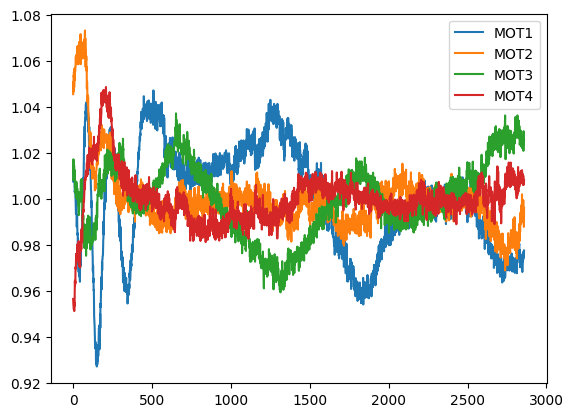

In [199]:
plt.plot(y1pts,label='MOT1')
plt.plot(y2pts,label='MOT2')
plt.plot(y3pts,label='MOT3')
plt.plot(y4pts,label='MOT4')
plt.legend()

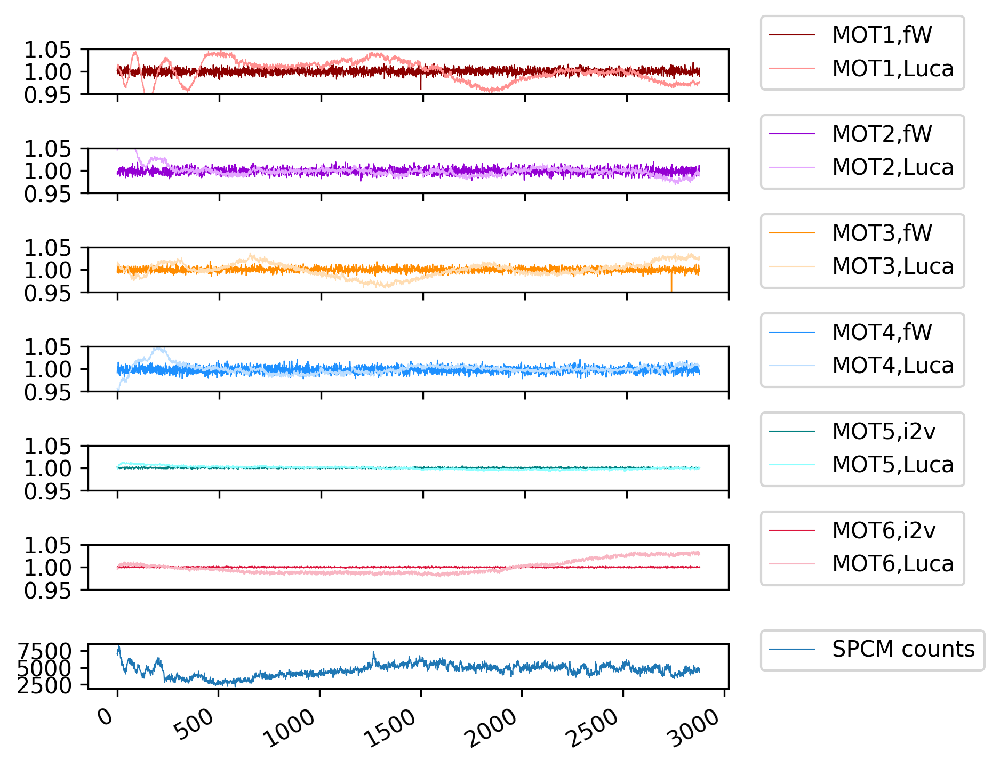

In [213]:
# plot each beam pair in its own subplot

labels = [f'MOT{i+1}' for i in range(6)]+['switchyard_in']
fig,axes = plt.subplots(nrows=7,dpi=300)
MOTaxes = axes[:6]
axSPCM = axes[-1]

for label,data_fW,data_luca,color,ax in zip(labels,MOTdata[:6],[y1pts,y2pts,y3pts,y4pts,y5pts,y6pts],colors,
                                         MOTaxes):
    xpts = range(len(data_fW))
#     ax.scatter(xpts, ypts, color=color,s=0.1)
    det_str = ',fW' if float(label[-1]) < 5 else ',i2v'
    ax.plot(data_fW[23:], color=color, label=label+det_str,linewidth=0.5)
    ax.plot(data_luca, color=lighten_color(color,0.3), label=label+',Luca',linewidth=0.5)
    ax.set_ylim((0.95,1.05))
    ax.legend(loc=(1.05,0.1))
ax.get_xaxis().set_visible(False)
    
ax.legend(loc=(1.05,0.1))
ax.get_xaxis().set_visible(False)
counts_steps = len(counts_Hz)

# hr0 = 17
# min0 = 10
# timestamps = [((hr0+(min0+i)//60)%24,(min0+i)%60) for i in range(900)]

# SPCM data
axSPCM.plot(range(counts_steps),counts_Hz,label='SPCM counts',linewidth=0.5)
# ax2.set_xticks(timestamps)
plt.gcf().autofmt_xdate()
axSPCM.legend(loc=(1.05,0.4))
fig.tight_layout()

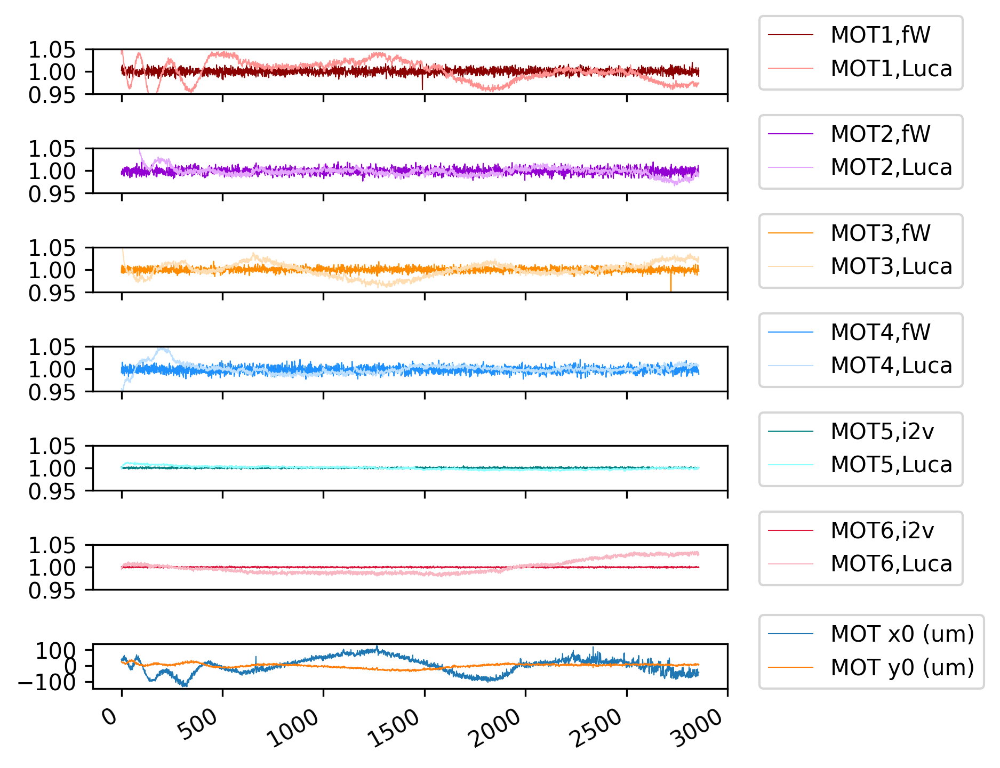

In [249]:
# plot the MOT positions instead of the SPCM counts

labels = [f'MOT{i+1}' for i in range(6)]+['switchyard_in']
fig,axes = plt.subplots(nrows=7,dpi=300)
MOTaxes = axes[:6]
axSPCM = axes[-1]

for label,data_fW,data_luca,color,ax in zip(labels,MOTdata[:6],[y1pts,y2pts,y3pts,y4pts,y5pts,y6pts],colors,
                                         MOTaxes):
    xpts = range(len(data_fW))
#     ax.scatter(xpts, ypts, color=color,s=0.1)
    det_str = ',fW' if float(label[-1]) < 5 else ',i2v'
    ax.plot(data_fW[23:], color=color, label=label+det_str,linewidth=0.5)
    ax.plot(data_luca, color=lighten_color(color,0.3), label=label+',Luca',linewidth=0.5)
    ax.set_ylim((0.95,1.05))
    ax.legend(loc=(1.05,0.1))
ax.get_xaxis().set_visible(False)
    
ax.legend(loc=(1.05,0.1))
ax.get_xaxis().set_visible(False)
counts_steps = len(counts_Hz)

# MOT position data
axSPCM.plot((positions_x - np.mean(positions_x))/pixels_per_um,label='MOT x0 (um)',linewidth=0.5)
axSPCM.plot((positions_y - np.mean(positions_y))/pixels_per_um,label='MOT y0 (um)',linewidth=0.5)
# ax2.set_xticks(timestamps)
plt.gcf().autofmt_xdate()
axSPCM.legend(loc=(1.05,0.0))
fig.tight_layout()

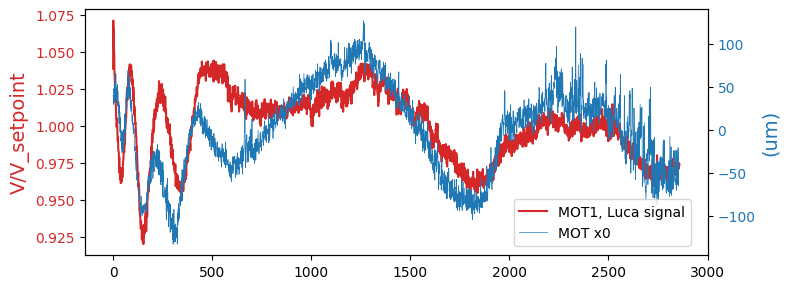

In [265]:
fig, ax1 = plt.subplots(figsize=(8,3))

color = 'tab:red'
# ax1.set_xlabel('time (s)')
ax1.set_ylabel('V/V_setpoint', color=color,fontsize=14)
ax1.plot(y1pts, color=color, label='MOT1, Luca signal')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('(um)', color=color,fontsize=14)  # we already handled the x-label with ax1
ax2.plot((positions_x - np.mean(positions_x))/pixels_per_um,label='MOT x0',linewidth=0.5, color=color)
ax2.tick_params(axis='y', labelcolor=color)
fig.legend(loc=(0.65,0.15))
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

### plot the Luca data normalized to the counts from other MOT beam images
by normalizing, for example, the ROI for MOT3 to the counts in the same ROI but when an orthogonal beam MOT 2 is on,
we can see if it is the gain of the camera that is fluctuating rather than the MOT beam power.

In [216]:
# Luca data - sum the scattering from the ROIs and normalize to the mean of each
colors = ['darkred','darkviolet','darkorange','dodgerblue','teal','crimson','indigo']
# for label,data,color in zip(labels,MOTdata,colors):
lucaMOT1_data = lucaMOTdata[:,2,70:180,350:550]
lucaMOT1_background = lucaMOTdata[:,0,70:180,350:550] # the image when MOT 5 is on

lucaMOT2_data = lucaMOTdata[:,3,70:180,50:350]
lucaMOT2_background = lucaMOTdata[:,0,70:180,50:350] 

lucaMOT3_data = lucaMOTdata[:,4,470:570,0:300]
lucaMOT3_background = lucaMOTdata[:,0,470:570,0:300] 

lucaMOT4a_data = lucaMOTdata[:,5,70:180,50:350]
lucaMOT4b_data = lucaMOTdata[:,5,470:570,350:550]
lucaMOT4a_background = lucaMOTdata[:,0,70:180,50:350]
lucaMOT4b_background = lucaMOTdata[:,0,470:570,350:550]


lucaMOT5_data = lucaMOTdata[:,0,200:450,620:700]
lucaMOT6_data = lucaMOTdata[:,1,200:450,620:700]

y1pts = np.array([np.sum(lucaMOT1_data[i]) for i in range(lucadata_len)],dtype=float)
y1pts /= np.mean(y1pts)
y1_bg = np.array([np.sum(lucaMOT1_background[i]) for i in range(lucadata_len)],dtype=float)
y1_bg /= np.mean(y1_bg)
y1pts /= y1_bg

y2pts = np.array([np.sum(lucaMOT2_data[i]) for i in range(lucadata_len)],dtype=float)
y2pts /= np.mean(y2pts)
y2_bg = np.array([np.sum(lucaMOT2_background[i]) for i in range(lucadata_len)],dtype=float)
y2_bg /= np.mean(y2_bg)
y2pts /= y2_bg

y3pts = np.array([np.sum(lucaMOT3_data[i]) for i in range(lucadata_len)],dtype=float)
y3pts /= np.mean(y3pts)
y3_bg = np.array([np.sum(lucaMOT3_background[i]) for i in range(lucadata_len)],dtype=float)
y3_bg /= np.mean(y3_bg)
y3pts /= y3_bg

y4pts = np.array([np.sum(lucaMOT4a_data[i])+np.sum(lucaMOT4b_data[i])
                  for i in range(lucadata_len)],dtype=float)
y4pts /= np.mean(y4pts)
y5pts = np.array([np.sum(lucaMOT5_data[i]) for i in range(lucadata_len)],dtype=float)
y5pts /= np.mean(y5pts)
y6pts = np.array([np.sum(lucaMOT6_data[i]) for i in range(lucadata_len)],dtype=float)
y6pts /= np.mean(y6pts)
xpts = range(len(y4pts))
    

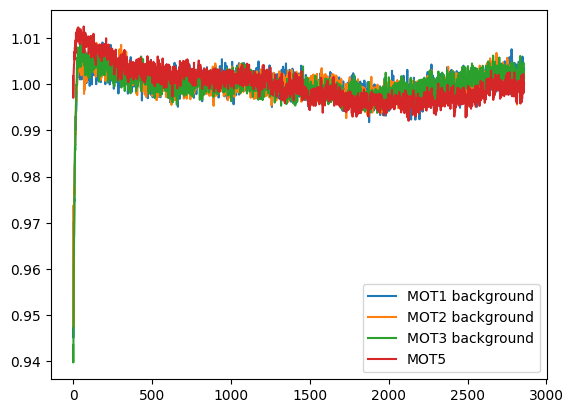

In [222]:
plt.plot(y1_bg,label='MOT1 background')
plt.plot(y2_bg,label='MOT2 background')
plt.plot(y3_bg,label='MOT3 background')
plt.plot(y5pts,label='MOT5')
# plt.plot(y4pts,label='MOT4')
plt.legend()

I don't believe the MOT beams are actually drifting like this. I think it has to be the camera alignment drifting.

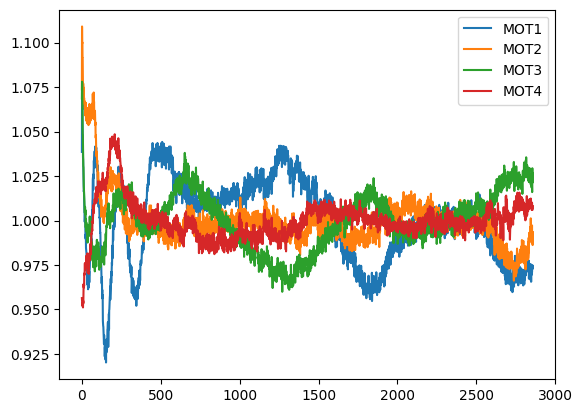

In [217]:
plt.plot(y1pts,label='MOT1')
plt.plot(y2pts,label='MOT2')
plt.plot(y3pts,label='MOT3')
plt.plot(y4pts,label='MOT4')
plt.legend()

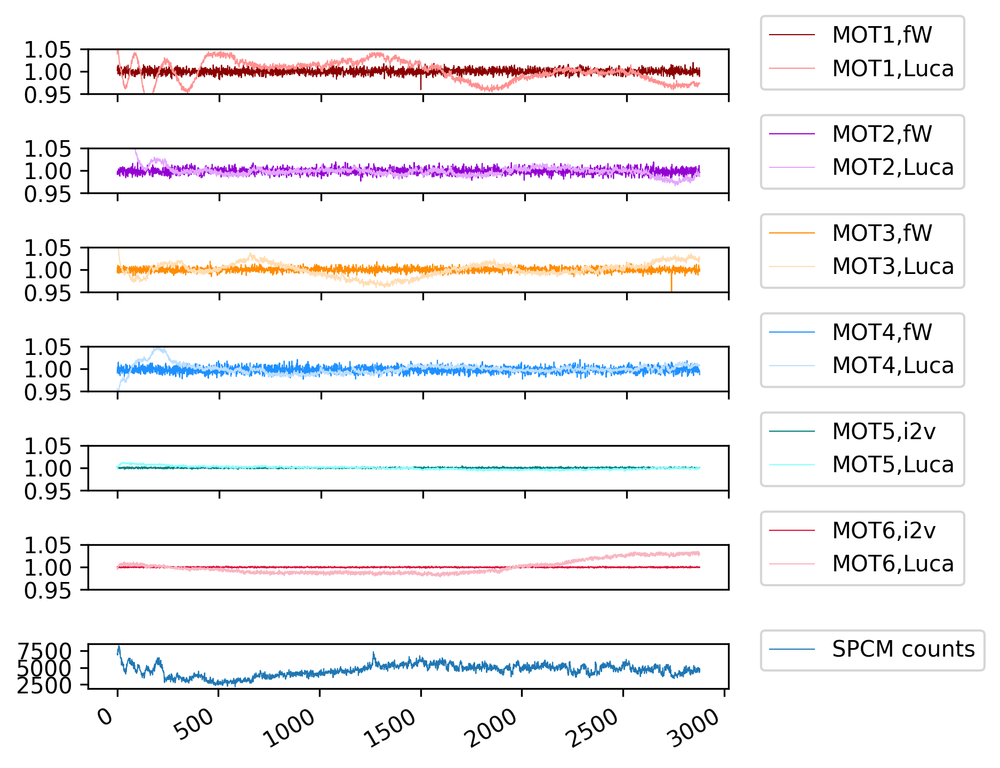

In [218]:
# plot each beam pair in its own subplot

labels = [f'MOT{i+1}' for i in range(6)]+['switchyard_in']
fig,axes = plt.subplots(nrows=7,dpi=300)
MOTaxes = axes[:6]
axSPCM = axes[-1]

for label,data_fW,data_luca,color,ax in zip(labels,MOTdata[:6],[y1pts,y2pts,y3pts,y4pts,y5pts,y6pts],colors,
                                         MOTaxes):
    xpts = range(len(data_fW))
#     ax.scatter(xpts, ypts, color=color,s=0.1)
    det_str = ',fW' if float(label[-1]) < 5 else ',i2v'
    ax.plot(data_fW[23:], color=color, label=label+det_str,linewidth=0.5)
    ax.plot(data_luca, color=lighten_color(color,0.3), label=label+',Luca',linewidth=0.5)
    ax.set_ylim((0.95,1.05))
    ax.legend(loc=(1.05,0.1))
ax.get_xaxis().set_visible(False)
    
ax.legend(loc=(1.05,0.1))
ax.get_xaxis().set_visible(False)
counts_steps = len(counts_Hz)

# hr0 = 17
# min0 = 10
# timestamps = [((hr0+(min0+i)//60)%24,(min0+i)%60) for i in range(900)]

# SPCM data
axSPCM.plot(range(counts_steps),counts_Hz,label='SPCM counts',linewidth=0.5)
# ax2.set_xticks(timestamps)
plt.gcf().autofmt_xdate()
axSPCM.legend(loc=(1.05,0.4))
fig.tight_layout()

In [79]:
data_luca.shape, len(xpts)

((2859,), 2859)

In [80]:
min(data_luca), max(data_luca)

(0.9270687836057367, 1.0470344915511098)

## 2023.09.08

### import data

In [176]:
f = h5py.File(os.path.join(results, '2023-09-08\\17\\000005153-MOTMonitorEverything.h5'))
[x for x in f['datasets'].values()]

[<HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "FORT_monitor": shape (2901,), type "<f8">,
 <HDF5 dataset "MOT1_monitor": shape (2901,), type "<f8">,
 <HDF5 dataset "MOT2_monitor": shape (2901,), type "<f8">,
 <HDF5 dataset "MOT3_monitor": shape (2901,), type "<f8">,
 <HDF5 dataset "MOT4_monitor": shape (2901,), type "<f8">,
 <HDF5 dataset "MOT5_monitor": shape (2901,), type "<f8">,
 <HDF5 dataset "MOT6_monitor": shape (2901,), type "<f8">,
 <HDF5 dataset "MOT_switchyard_monitor": shape (2901,), type "<f8">,
 <HDF5 dataset "SPCM_count_rate_Hz": shape (2881,), type "<f8">,
 <HDF5 dataset "monitor_pts": shape (1,), type "<i4">,
 <HDF5 dataset "p_cooling_DP_MOT": shape (), type "<f8">]

In [195]:
MOTdata = [np.array(data) for data in  f['datasets'].values()][7:14]
counts_Hz = np.array(f['datasets']['SPCM_count_rate_Hz'])[17:]

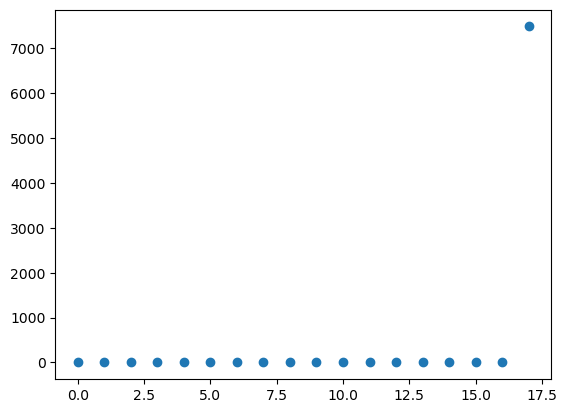

In [191]:
l=18
plt.scatter(range(l),counts_Hz[:l])

In [44]:
filenames = ["MOTStabilityChecks_20230908.tif", 
             "MOTStabilityChecks_20230908_X2.tif",
             "MOTStabilityChecks_20230908_X3.tif"]

tifstack = np.array(list(itertools.chain(*[tifffile.imread(os.path.join(images,f))
    for f in filenames
]))) # flattening tifstackList

In [54]:
len(tifstack[20*6:])%7

0

In [55]:
tifstack.shape

(20280, 301, 401)

In [134]:
lucaMOTdata = np.reshape(tifstack[20*6:],(-1,7,301,401))

In [135]:
lucaMOTdata.shape

(2880, 7, 301, 401)

In [136]:
lucadata_len = lucaMOTdata.shape[0]

we were monitoring the coil monitor outputs and zotino using the Labjack T7 and GOOD logger.
however, because the file was large, the good reader froze and I had to remote into the server
that runs origin to get the data. 

I wrote a sql command to get the data, a bashscript to run the sql command, and then ran the 
bashscript directing the output to a csv file which I obtained through an scp command. detailed notes
on how to do all this are on the wiki in origin notes.

In [309]:
origin_file = os.path.join(csvdata,"qn_labjack_data_20230908_coil_monitoring.csv")
has_header = True
with open(origin_file, 'r', newline='') as f:
    reader = csv.reader(f, delimiter='\t')
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]
    f.close()

### coil data analysis

In [310]:
header

['measurement_time',
 'Ch10',
 'Ch1',
 'Ch2',
 'Ch3',
 'Ch4',
 'Ch5',
 'Ch6',
 'Ch7',
 'Ch8',
 'Ch9']

In [311]:
data = np.array(data,float).transpose()

In [312]:
data.shape

(11, 6861586)

In [314]:
# zotino y, x, top, bottom = ch3, 4, 5, 6
# coils top, bottom, x, y = 7, 8, 9, 10 monitor zotino. 
channel_map = {'Ch3':'A-Y zotino','Ch4':'A-X zotino','Ch5':'A-Zbottom zotino','Ch6':'A-Ztop zotino',
               'Ch7':'A-Zbottom monitor','Ch8':'A-Ztop monitor','Ch9':'A-X monitor','Ch10':'A-Y monitor'}

data_dict = {}
for row,channel in zip(data,header):
    data_dict[channel]=row

data_names = ['A-Ztop monitor','A-Zbottom monitor','A-X monitor','A-Y monitor',
              'A-Ztop zotino','A-Zbottom zotino','A-X zotino','A-Y  zotino',]

data_named_dict = {'time':data[0]}

for channel in header:
    if channel in channel_map.keys():
        name = channel_map[channel]
        data_named_dict[name] = data_dict[channel]

In [338]:
x = data[0][100]
dt.utcfromtimestamp(x/2**32 - 5*3600).strftime(
    '%m-%d %H:%M:%S')

'09-08 17:35:01'

In [339]:
origintime_to_dt(data[0][0]), origintime_to_dt(data[0][-1])

('09-08 17:35', '09-09 18:21')

In [341]:
26*3600/len(data[0])

0.01364116109599151

In [273]:
timestamps = [origintime_to_dt(x) for x in data[0]]

In [271]:
timestamps.shape

(5912901,)

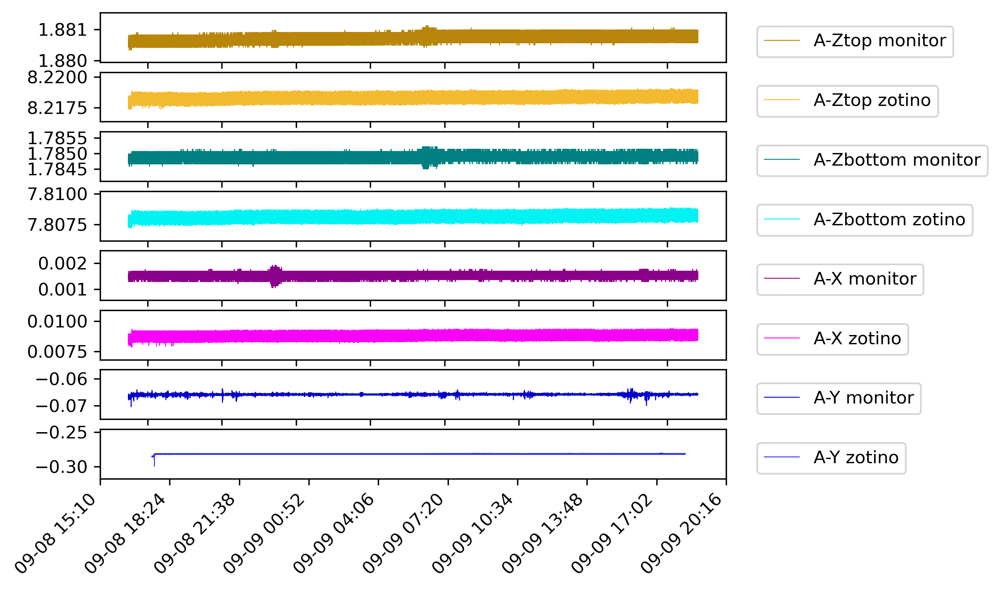

In [320]:
"""
the fluctuations here are order 1 mV, so they do not seem concerning. also, we set up the test
in such a way as to check whether several things were the cause of the noisy behavior we previously
observed.
"""

fig,axes = plt.subplots(nrows=8,dpi=300)

labels =['A-Ztop monitor','A-Ztop zotino','A-Zbottom monitor','A-Zbottom zotino',
         'A-X monitor','A-X zotino','A-Y monitor','A-Y zotino',]
colors = ['darkgoldenrod',lighten_color('darkgoldenrod',0.7),
          'teal',lighten_color('teal',0.7),
          'darkmagenta',lighten_color('darkmagenta',0.7),
          'mediumblue',lighten_color('mediumblue',0.7)]
ylims = [(4,6),(-0.1,0.1),(5,9)]
for ax,label,color in zip(axes,labels,colors):
    ax.plot(data[0], data_named_dict[label], label=label,color=color,linewidth=0.5)
    datamean = np.mean(data_named_dict[label])
    datamaxdev = max(abs(datamean - data_named_dict[label]))
    ax.set_ylim((datamean - 2*datamaxdev,datamean + 2*datamaxdev))
    ax.legend(loc=(1.05,0.1))
xticks = ax.get_xticks()
ax.set_xticks(ticks=xticks,labels=[origintime_to_dt(x) for x in xticks])
plt.xticks(rotation=45, ha='right')
plt.show()

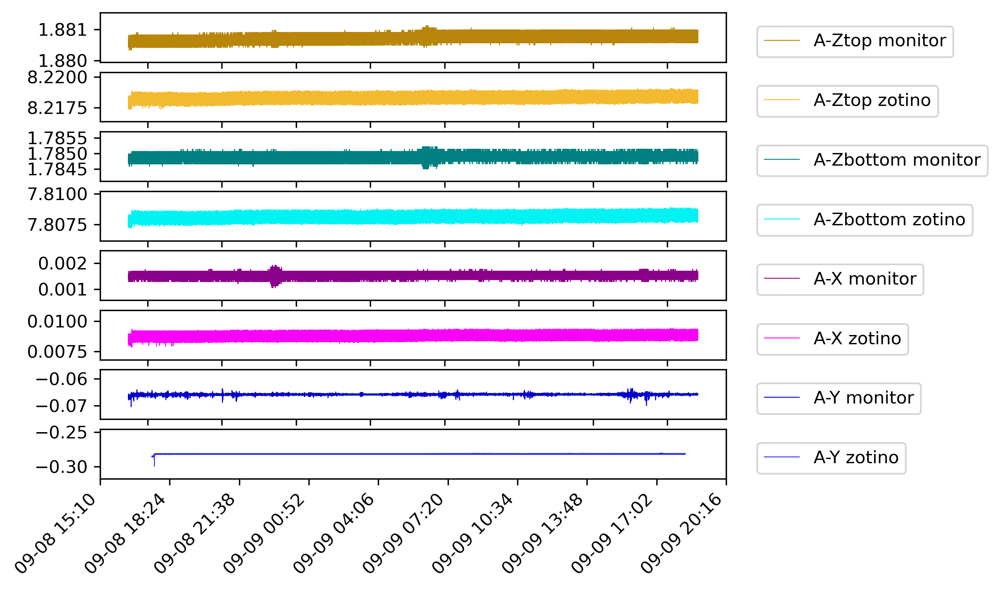

In [320]:
"""
there might be a timing problem with the GOOD logger or origin, as can be seen in the plots
below, particularly on A-Zbottom monitor and A-Y zotino. if that is real, I'm not sure what 
would cause it.
"""

fig,axes = plt.subplots(nrows=8,dpi=300)

labels =['A-Ztop monitor','A-Ztop zotino','A-Zbottom monitor','A-Zbottom zotino',
         'A-X monitor','A-X zotino','A-Y monitor','A-Y zotino',]
colors = ['darkgoldenrod',lighten_color('darkgoldenrod',0.7),
          'teal',lighten_color('teal',0.7),
          'darkmagenta',lighten_color('darkmagenta',0.7),
          'mediumblue',lighten_color('mediumblue',0.7)]
ylims = [(4,6),(-0.1,0.1),(5,9)]
for ax,label,color in zip(axes,labels,colors):
    ax.plot(data[0], data_named_dict[label], label=label,color=color,linewidth=0.5)
    datamean = np.mean(data_named_dict[label])
    datamaxdev = max(abs(datamean - data_named_dict[label]))
    ax.set_ylim((datamean - 2*datamaxdev,datamean + 2*datamaxdev))
    ax.legend(loc=(1.05,0.1))
xticks = ax.get_xticks()
ax.set_xticks(ticks=xticks,labels=[origintime_to_dt(x) for x in xticks])
plt.xticks(rotation=45, ha='right')
plt.show()

### find ROIs for the MOT beam scattering

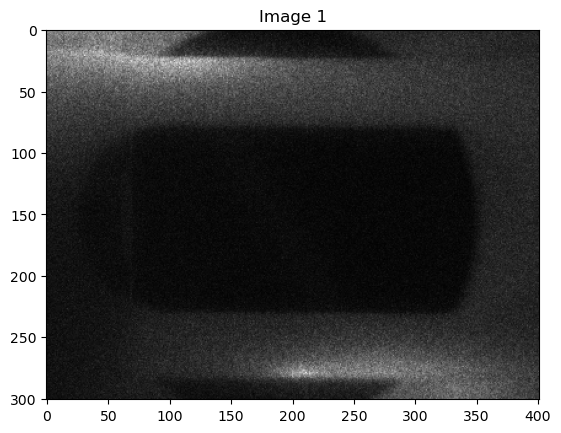

In [114]:
for i in range(1):# #7):
    image = lucaMOTdata[i,5]
    plt.imshow(image, cmap='gray')
    plt.title(f"Image {i+1}")
    plt.show()

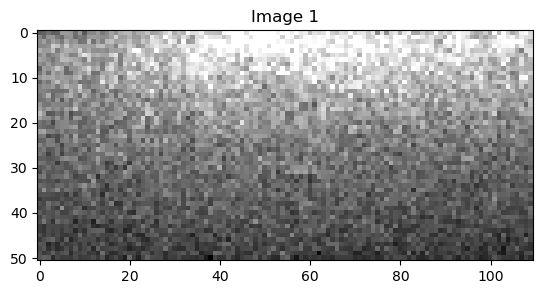

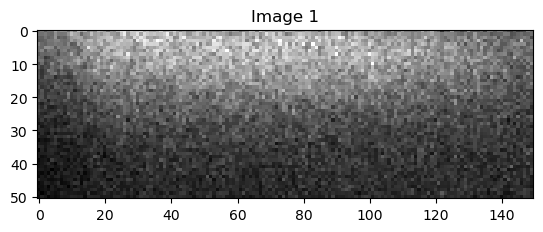

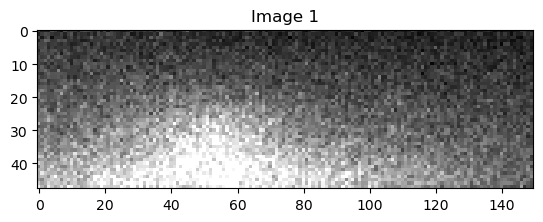

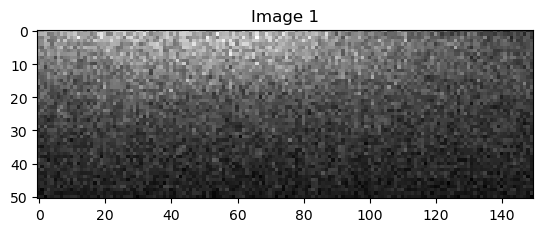

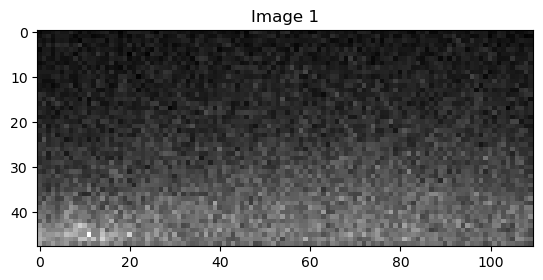

In [115]:
# use 2 ROIs, one for each strip of the macor tube where the most scattering from
# the on-chip MOT beams occurs

# MOT1
image = lucaMOTdata[i,2][24:75,200:310]
plt.imshow(image, cmap='gray')
plt.title(f"Image {i+1}")
plt.show()

# MOT2 dh=212
image = lucaMOTdata[i,3][24:75,50:200]
plt.imshow(image, cmap='gray')
plt.title(f"Image {i+1}")
plt.show()

# MOT3 
dh=212
image = lucaMOTdata[i,4][22+dh:70+dh,50:200]
plt.imshow(image, cmap='gray')
plt.title(f"Image {i+1}")
plt.show()

# scattering from MOT4 is weak, so use two ROIs
# MOT4a
image = lucaMOTdata[i,5][24:75,50:200]
plt.imshow(image, cmap='gray')
plt.title(f"Image {i+1}")
plt.show()
# MOT4b
image = lucaMOTdata[i,5][22+dh:70+dh,200:310]
plt.imshow(image, cmap='gray')
plt.title(f"Image {i+1}")
plt.show()

### plot fW, Luca, SPCM datasets alongside each other

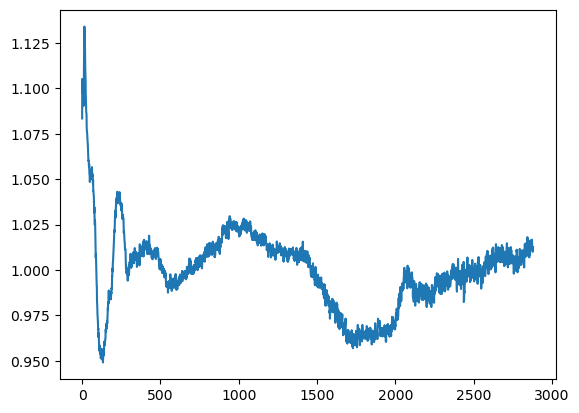

In [163]:
fig,ax = plt.subplots()
lucaMOT1data = lucaMOTdata[:,2,24:75,200:310]
ypts = np.array([np.sum(lucaMOT1data[i]) for i in range(lucadata_len)],dtype=float)
ypts /= np.mean(ypts)
xpts = range(len(ypts))
#     ax.scatter(xpts, ypts, color=color,s=0.1)
ax.plot(xpts, ypts) #, color=color, label=label,linewidth=0.5)

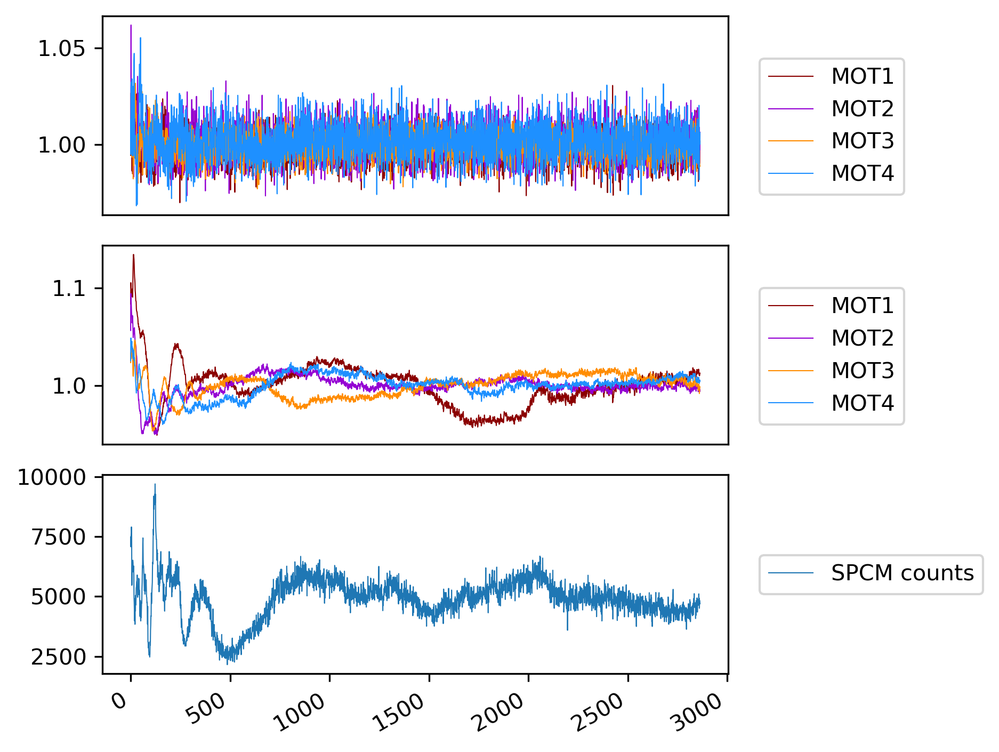

In [196]:
# fW detector data
labels = [f'MOT{i+1}' for i in range(6)]+['switchyard_in']
fig,axes = plt.subplots(nrows=3,dpi=300)
ax, ax2, ax3 = axes
colors = ['darkred','darkviolet','darkorange','dodgerblue','teal','crimson','indigo']
for label,data,color in zip(labels,MOTdata[:4],colors):
    ypts = data[20:] # the feedback runs 20 times before we start counting photons
    xpts = range(len(ypts))
#     ax.scatter(xpts, ypts, color=color,s=0.1)
    ax.plot(xpts, ypts, color=color, label=label,linewidth=0.5)
#     ax.set_ylim((0.95,1.05))
    ax.legend(loc=(1.05,0.1))
ax.get_xaxis().set_visible(False)

# Luca data - sum the scattering from the ROIs and normalize to the mean of each
colors = ['darkred','darkviolet','darkorange','dodgerblue','teal','crimson','indigo']
# for label,data,color in zip(labels,MOTdata,colors):
lucaMOT1_data = lucaMOTdata[:,2,24:75,200:310]
lucaMOT2_data = lucaMOTdata[:,3,24:75,50:200]
lucaMOT3_data = lucaMOTdata[:,4,22+dh:70+dh,50:200]
lucaMOT4a_data = lucaMOTdata[:,5,24:75,50:200]
lucaMOT4b_data = lucaMOTdata[:,5,22+dh:70+dh,200:310]

y1pts = np.array([np.sum(lucaMOT1_data[i]) for i in range(lucadata_len)],dtype=float)
y1pts /= np.mean(y1pts)
y2pts = np.array([np.sum(lucaMOT2_data[i]) for i in range(lucadata_len)],dtype=float)
y2pts /= np.mean(y2pts)
y3pts = np.array([np.sum(lucaMOT3_data[i]) for i in range(lucadata_len)],dtype=float)
y3pts /= np.mean(y3pts)
y4pts = np.array([np.sum(lucaMOT4a_data[i])+np.sum(lucaMOT4b_data[i]) 
                  for i in range(lucadata_len)],dtype=float)
y4pts /= np.mean(y4pts)
xpts = range(len(y4pts))
for i,y in enumerate([y1pts,y2pts,y3pts,y4pts]):
    ax2.plot(xpts, y, color=colors[i], label=f"MOT{i+1}", linewidth=0.5)
# ax2.set_ylim((0.95,1.05))
ax2.legend(loc=(1.05,0.1))
ax2.get_xaxis().set_visible(False)
counts_steps = len(counts_Hz)

# hr0 = 17
# min0 = 10
# timestamps = [((hr0+(min0+i)//60)%24,(min0+i)%60) for i in range(900)]

# SPCM data
ax3.plot(range(counts_steps),counts_Hz,label='SPCM counts',linewidth=0.5)
# ax2.set_xticks(timestamps)
plt.gcf().autofmt_xdate()
ax3.legend(loc=(1.05,0.4))
fig.tight_layout()

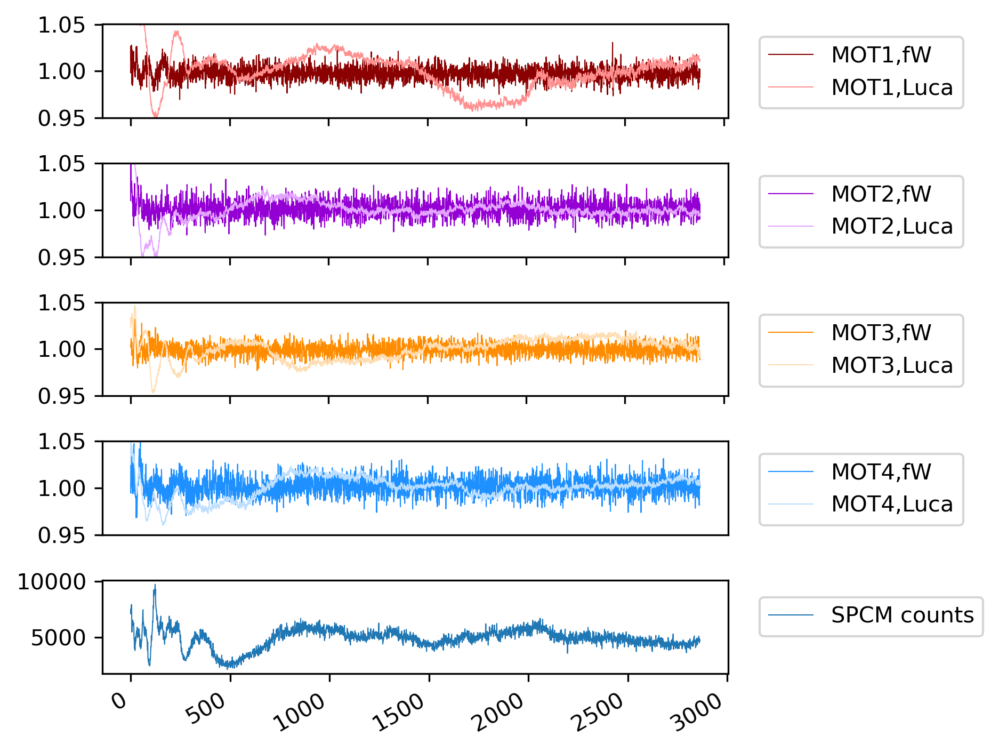

In [210]:
# plot each beam pair in its own subplot

# fW detector data
labels = [f'MOT{i+1}' for i in range(6)]+['switchyard_in']
fig,axes = plt.subplots(nrows=5,dpi=300)
MOTaxes = axes[:4]
axSPCM = axes[-1]
# colors = ['darkred','darkviolet','darkorange','dodgerblue','teal','crimson','indigo']
# for label,data,color in zip(labels,MOTdata[:4],colors):
#     ypts = data[20:] # the feedback runs 20 times before we start counting photons
#     xpts = range(len(ypts))
# #     ax.scatter(xpts, ypts, color=color,s=0.1)
#     ax.plot(xpts, ypts, color=color, label=label,linewidth=0.5)
# #     ax.set_ylim((0.95,1.05))
#     ax.legend(loc=(1.05,0.1))
# ax.get_xaxis().set_visible(False)

# Luca data - sum the scattering from the ROIs and normalize to the mean of each
colors = ['darkred','darkviolet','darkorange','dodgerblue','teal','crimson','indigo']
# for label,data,color in zip(labels,MOTdata,colors):
lucaMOT1_data = lucaMOTdata[:,2,24:75,200:310]
lucaMOT2_data = lucaMOTdata[:,3,24:75,50:200]
lucaMOT3_data = lucaMOTdata[:,4,22+dh:70+dh,50:200]
lucaMOT4a_data = lucaMOTdata[:,5,24:75,50:200]
lucaMOT4b_data = lucaMOTdata[:,5,22+dh:70+dh,200:310]

y1pts = np.array([np.sum(lucaMOT1_data[i]) for i in range(lucadata_len)],dtype=float)
y1pts /= np.mean(y1pts)
y2pts = np.array([np.sum(lucaMOT2_data[i]) for i in range(lucadata_len)],dtype=float)
y2pts /= np.mean(y2pts)
y3pts = np.array([np.sum(lucaMOT3_data[i]) for i in range(lucadata_len)],dtype=float)
y3pts /= np.mean(y3pts)
y4pts = np.array([np.sum(lucaMOT4a_data[i])+np.sum(lucaMOT4b_data[i])
                  for i in range(lucadata_len)],dtype=float)
y4pts /= np.mean(y4pts)
xpts = range(len(y4pts))
# for i,y in enumerate([y1pts,y2pts,y3pts,y4pts]):
#     ax.plot(xpts, y, color=colors[i], label=f"MOT{i+1}", linewidth=0.5)
    
for label,data_fW,data_luca,color,ax in zip(labels,MOTdata[:4],[y1pts,y2pts,y3pts,y4pts],colors,
                                         MOTaxes):
#     ypts =  # the feedback runs 20 times before we start counting photons
    xpts = range(len(data_fW[21:]))
#     ax.scatter(xpts, ypts, color=color,s=0.1)
    ax.plot(xpts, data_fW[21:], color=color, label=label+',fW',linewidth=0.5)
    ax.plot(xpts, data_luca, color=lighten_color(color,0.3), label=label+',Luca',linewidth=0.5)
    ax.set_ylim((0.95,1.05))
    ax.legend(loc=(1.05,0.1))
ax.get_xaxis().set_visible(False)
    
ax.legend(loc=(1.05,0.1))
ax.get_xaxis().set_visible(False)
counts_steps = len(counts_Hz)

# hr0 = 17
# min0 = 10
# timestamps = [((hr0+(min0+i)//60)%24,(min0+i)%60) for i in range(900)]

# SPCM data
axSPCM.plot(range(counts_steps),counts_Hz,label='SPCM counts',linewidth=0.5)
# ax2.set_xticks(timestamps)
plt.gcf().autofmt_xdate()
axSPCM.legend(loc=(1.05,0.4))
fig.tight_layout()

In [ ]:
### 

## 2023.09.01

SPCM signal with feedback on, monitored by running SamplerMOTCoilTune. I zeroed the potentiometer box and ran the code on differential mode, with the coil values set to what gave 10 kHz counts in a previous run. Note however that I was only getting ~ 8 kHz counts in the most recent run

In [2]:
f = h5py.File(os.path.join(results, '2023-08-31\\17\\000004757-SamplerMOTCoilTune.h5'))
[x for x in f['datasets'].values()]

[<HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "MOT1_monitor": shape (921,), type "<f8">,
 <HDF5 dataset "MOT2_monitor": shape (921,), type "<f8">,
 <HDF5 dataset "MOT3_monitor": shape (921,), type "<f8">,
 <HDF5 dataset "MOT4_monitor": shape (921,), type "<f8">,
 <HDF5 dataset "MOT5_monitor": shape (921,), type "<f8">,
 <HDF5 dataset "MOT6_monitor": shape (921,), type "<f8">,
 <HDF5 dataset "MOT_switchyard_monitor": shape (921,), type "<f8">,
 <HDF5 dataset "SPCM_count_rate_Hz": shape (180005,), type "<f8">,
 <HDF5 dataset "SPCM_max_counts_and_volts": shape (5,), type "<f8">,
 <HDF5 dataset "monitor_pts": shape (1,), type "<i4">,
 <HDF5 dataset "p_cooling_DP_MOT": shape (), type "<f8">]

In [141]:
MOTdata = [np.array(data) for data in  f['datasets'].values()][6:13]
counts_Hz = np.array(f['datasets']['SPCM_count_rate_Hz'])

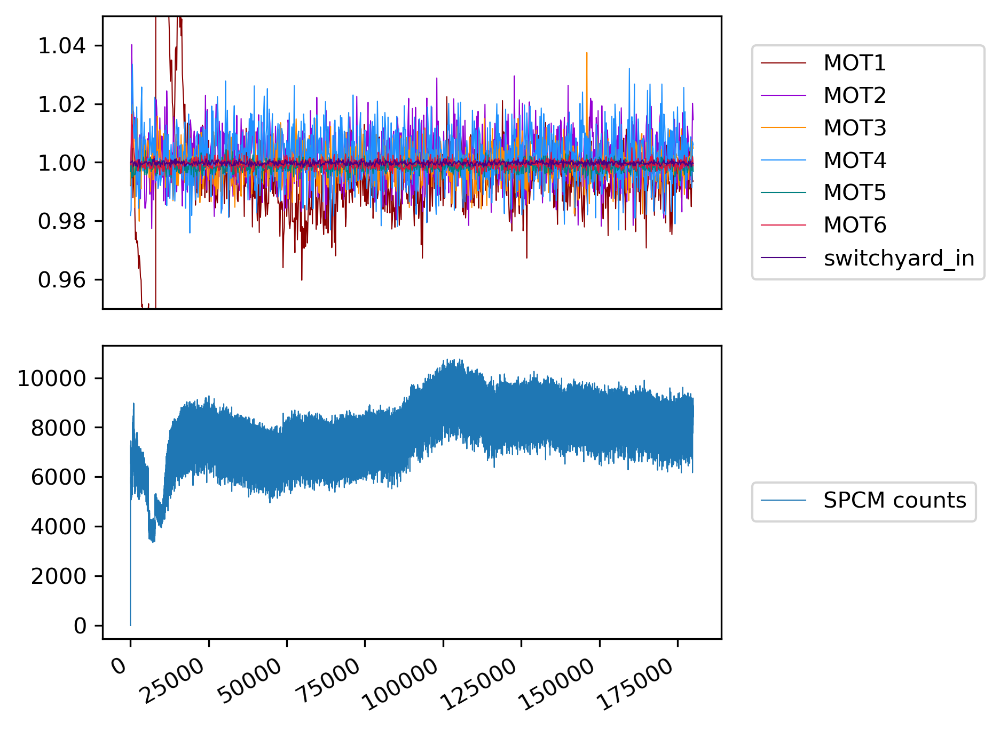

In [210]:
# the dip shown between about 30 and 500 is when I intentionally made the MOT go completely
# away by tuning the X shim, and then brought the MOT back to the same location "by hand".
# the duration of the experiment was about 10 minutes. every point showing the MOT power was
# plotted just after the feedback was run.

labels = [f'MOT{i+1}' for i in range(6)]+['switchyard_in']
fig,axes = plt.subplots(nrows=2,dpi=300)
ax, ax2 = axes
colors = ['darkred','darkviolet','darkorange','dodgerblue','teal','crimson','indigo']
for label,data,color in zip(labels,MOTdata,colors):
    ypts = data[20:] # the feedback runs 20 times before we start counting photons
    xpts = range(len(ypts))
#     ax.scatter(xpts, ypts, color=color,s=0.1)
    ax.plot(xpts, ypts, color=color, label=label,linewidth=0.5)
    ax.set_ylim((0.95,1.05))
    ax.legend(loc=(1.05,0.1))
ax.get_xaxis().set_visible(False)
counts_steps = len(counts_Hz)

hr0 = 17
min0 = 10
timestamps = [((hr0+(min0+i)//60)%24,(min0+i)%60) for i in range(900)]

ax2.plot(range(counts_steps),counts_Hz,label='SPCM counts',linewidth=0.5)
# ax2.set_xticks(timestamps)
plt.gcf().autofmt_xdate()
ax2.legend(loc=(1.05,0.4))
fig.tight_layout()

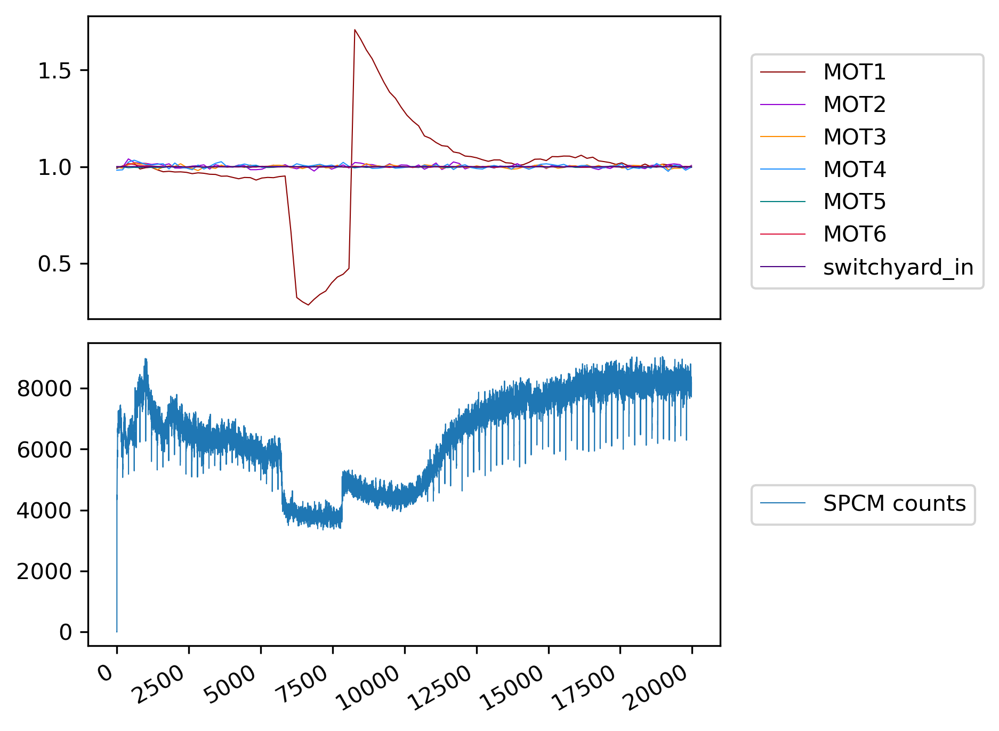

In [218]:
pts = 100
labels = [f'MOT{i+1}' for i in range(6)]+['switchyard_in']
fig,axes = plt.subplots(nrows=2,dpi=300)
ax, ax2 = axes
colors = ['darkred','darkviolet','darkorange','dodgerblue','teal','crimson','indigo']
for label,data,color in zip(labels,MOTdata,colors):
    ypts = data[20:pts+20] # the feedback runs 20 times before we start counting photons
    xpts = range(len(ypts))
#     ax.scatter(xpts, ypts, color=color,s=0.1)
    ax.plot(xpts, ypts, color=color, label=label,linewidth=0.5)
#     ax.set_ylim((0.95,1.05))
    ax.legend(loc=(1.05,0.1))
ax.get_xaxis().set_visible(False)
counts_steps = int(len(counts_Hz)*pts/len(data[20:])) #len(counts_Hz)

ax2.plot(range(counts_steps),counts_Hz[:counts_steps],label='SPCM counts',linewidth=0.5)
plt.gcf().autofmt_xdate()
ax2.legend(loc=(1.05,0.4))
fig.tight_layout()

In [223]:
n = 1500 #len(counts_Hz)
(0.314*n+(n//200)*0.1)/60

7.861666666666666

## 2023.08.31

SPCM signal with feedback on, monitored by running SamplerMOTCoilTune. I zeroed the potentiometer box and ran the code on differential mode, with the coil values set to what gave 10 kHz counts in a previous run.

In [110]:
f = h5py.File(os.path.join(results, '2023-08-31\\15\\000004752-SamplerMOTCoilTune.h5'))
[x for x in f['datasets'].values()]

[<HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "MOT1_monitor": shape (31,), type "<f8">,
 <HDF5 dataset "MOT2_monitor": shape (31,), type "<f8">,
 <HDF5 dataset "MOT3_monitor": shape (31,), type "<f8">,
 <HDF5 dataset "MOT4_monitor": shape (31,), type "<f8">,
 <HDF5 dataset "MOT5_monitor": shape (31,), type "<f8">,
 <HDF5 dataset "MOT6_monitor": shape (31,), type "<f8">,
 <HDF5 dataset "MOT_switchyard_monitor": shape (31,), type "<f8">,
 <HDF5 dataset "SPCM_count_rate_Hz": shape (2005,), type "<f8">,
 <HDF5 dataset "SPCM_max_counts_and_volts": shape (5,), type "<f8">,
 <HDF5 dataset "monitor_pts": shape (1,), type "<i4">,
 <HDF5 dataset "p_cooling_DP_MOT": shape (), type "<f8">]

In [111]:
MOTdata = [np.array(data) for data in  f['datasets'].values()][6:13]
counts_Hz = np.array(f['datasets']['SPCM_count_rate_Hz'])

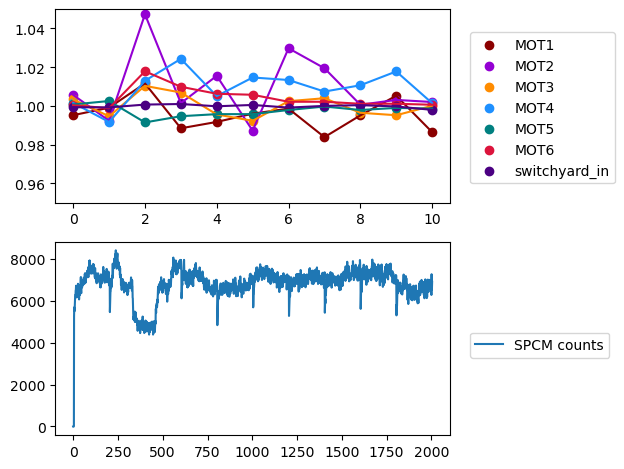

In [138]:
# the dip shown between about 30 and 500 is when I intentionally made the MOT go completely
# away by tuning the X shim, and then brought the MOT back to the same location "by hand".
# the duration of the experiment was about 10 minutes. every point showing the MOT power was
# plotted just after the feedback was run.

labels = [f'MOT{i+1}' for i in range(6)]+['switchyard_in']
fig,axes = plt.subplots(nrows=2)
ax, ax2 = axes
colors = ['darkred','darkviolet','darkorange','dodgerblue','teal','crimson','indigo']
for label,data,color in zip(labels,MOTdata,colors):
    ypts = data[20:] # the feedback runs 20 times before we start counting photons
    xpts = range(len(ypts))
    ax.scatter(xpts, ypts, label=label, color=color)
    ax.plot(xpts, ypts, color=color)
    ax.set_ylim((0.95,1.05))
    ax.legend(loc=(1.05,0.1))
ax2.plot(range(len(counts_Hz)),counts_Hz,label='SPCM counts')
ax2.legend(loc=(1.05,0.4))
fig.tight_layout()